In [252]:
#from code import *
# in later version, functions will be in seperate file...
%matplotlib inline


import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import LogNorm
import numba
from scipy.ndimage.filters import gaussian_filter1d
import pandas as pd
import scipy.linalg as la
from scipy.signal import welch, correlate2d
from tqdm import tqdm_notebook 

import multiprocessing
ncores = multiprocessing.cpu_count()

In [2]:
# helper functions, will be put in the "code.py" file in the end

def calc_mod_control(A):
    '''
    Calculate modal controllability for a given adjacency matrix
    '''
    evals, evecs = np.linalg.eig(A)
    assert evals.max()<1, "Normalization of SC with 2*lam_max"
    modal_c = np.zeros(94)
    for i in range(A.shape[0]):
        for j in range(A.shape[0]):
            modal_c[i] += (1-evals[j]**2)*evecs[i,j]**2
    return modal_c


def pairmul(v):
    vv = np.zeros((N,N))
    for i in np.arange(N):
        for j in np.arange(N):
            vv[i,j]=v[i]*v[j]
    return vv

def calc_ave_control(A):
    '''
    calculate Gramian, average controllability, 
    based on https://complexsystemsupenn.com/s/controllability_code-smb8.zip
    '''
    assert np.linalg.eigvals(A).max()<1, "Normalization of SC with 2*lam_max"
    N = A.shape[0]
    T,Z=la.schur(A)
    midMat= (Z**2).transpose()
    v=np.diag(T)
    vv = np.zeros((N,N))
    for i in np.arange(N):
        for j in np.arange(N):
            vv[i,j]=v[i]*v[j]
    P= np.repeat(np.diag(1-vv),N).reshape(N,N)
    average_c=np.sum(midMat/P , axis=0).transpose()
    return average_c


def load_parameters(singleNode=False, globalN=0, filename_SC='SC_m12av_94_voxNorm_th20.npy', filename_DM='DM_m12av_94_voxNorm.npy'):
    class struct(object):
        pass

    params = struct()
    #FHN parameters with:
    '''
    du/dt = -alpha u^3 + beta u^2 - gamma u - w + I_{ext}
    dw/dt = 1/tau (u + delta  - epsilon w)
    '''
    params.alpha = 3. 
    params.beta = 4. 
    params.gamma = -1.5 
    params.delta = 0.
    params.epsilon = 0.5 
    params.tau = 20. 
    
    ### runtime parameters
    params.dt = 0.1  # simulation timestep in ms 
    params.duration = 3000  # Simulation duration in ms

    ### network parameters
    if singleNode: # if you only want a single node with those parameters
        N = 1
        params.SC = np.zeros((N, N))
        params.DM = np.zeros((N, N))
    elif globalN>0: # if you want a network of N nodes, all uniformly connected
        N = globalN
        SC = np.ones((N,N))
        np.fill_diagonal(SC, 0)
        params.SC = SC
        params.DM = np.zeros((N, N))
    else: # this is what we usually want! Load the netowrk topology from the DTI images
        SC = np.load(filename_SC)
        N = SC.shape[0]          
        params.SC = SC
        params.DM = np.load(filename_DM)
    params.N = N  # number of nodes

    ### global parameters
    params.I = 0.5 # Background input
    params.K = 0.  # global coupling strength
    params.sigma = 0. # Variance of the additive noise
    params.c = 0.  # signal transmission speed
    
    ### Initialization noise
    params.init = (0,1,2,3) #initialize randomly with u in [0,1] & w in [2,3]

    params_dict = params.__dict__
    return params_dict


def timeIntegrationRK4(params, randomseed=0, xinit=np.zeros(94), yinit=np.zeros(94), stimNode=99, stimVal=1, stimOn=1000):
    '''
    Integrate the FHN equations including noise and coupling with RK2 scheme using @numba 
    and return the trajectories for the potential and the recovery variable.
    Equations:
    du_i/dt = - alpha u_i^3 + beta u_i^2 + gamma u_i - w + I + K * SC_ij*u_j(t-c*DM_ij) + sigma*noise 
    dw_i/dt = u_i - delta - epsilon w_i / tau
    
    Args:
        params: Parameter dictionary obtained by load_parameters() + modifications
        Important parameters for the integration are:
            init: (u0min, u0max, w0min, w0max): Limits for randomly drawn initial conditions for every node [mV]
            alpha, beta, gamma: FHN node parameters, determine du/dt
            delta, epsilon, tau: FHN node parameters, determine dw/dt            
            I: Constant background input 
            K: >0, Global coupling strength
            sigma: >0, Variance of the additive noise
            c: >=0, Transmission speed, converts the connection length in DM (DTI data) to a delay, no delay for c=0
            dt: Timestep for simulation [ms]
            duration: Total simulated time [ms]
            globalN:  >=0, Determines number of uniform SC, if 0 use DTI data for connectivity between nodes 
            randomseed: for reproducibility
    ''' 
    # load parameters from dictionary
    N = params['N']
    SC = params['SC']
    DM = params['DM']
    dt = params['dt']
    duration = params['duration']
    I = params['I']
    c = params['c']
    K = params['K']
    sigma = params['sigma']
   
    # FHN parameters
    alpha = params['alpha']
    beta = params['beta']
    gamma = params['gamma']
    delta = params['delta']
    epsilon = params['epsilon']
    tau = params['tau']
    
    # delay matrix:
    if c == 0:
        DM = np.zeros((N, N))
    elif c > 0:
        DM = DM / c / dt # length divided by transmission speed is delay, bring in units of timesteps
    else:
        raise Exception('Parameter c for signal speed must be positive!')
    maxDelay = int(np.max(np.ceil(DM)))
    if (maxDelay)>(duration/dt):
        raise Exception('Simulation time is not long enough for such a low transmission speed, choose higher c or much higher duration')
    # return arrays
    ts = np.arange(0, duration, dt)
    xs = np.zeros((N, len(ts)))
    ys = np.zeros((N, len(ts)))
    
    if randomseed > 0:
        np.random.seed(randomseed)
    if xinit.all() == 0 and randomseed>0:
        xinit = np.random.rand(N)
        yinit = np.random.rand(N)
    x_init = xinit
    y_init = yinit    
    if maxDelay > 0:
        xs[:,:maxDelay] = np.tile(x_init,(maxDelay,1)).T
        ys[:,:maxDelay] = np.tile(y_init,(maxDelay,1)).T
    else:
        xs[:,0] = x_init
        ys[:,0] = y_init
    # prepare noise vector with sigma = 1, factor sqrt_dt to make noise independent of timestep 
    noise = np.random.standard_normal(size=(N, len(ts))) / np.sqrt(dt)

    # actual integration is done with numba for speedup
    ts, xs, ys = timeIntegrationRK4Numba(dt, duration, stimNode, stimVal, stimOn,
                                N, SC, DM, maxDelay,
                                alpha, beta, gamma, delta, epsilon, tau,
                                I, K, sigma, noise,
                                ts, xs, ys)
    return ts, xs, ys, x_init, y_init, maxDelay
@numba.njit(locals = {'idxX': numba.int64, 'idxY':numba.int64, 'idx1':numba.int64, 'idy1':numba.int64})
def timeIntegrationRK4Numba(dt, duration, stimNode, stimVal, stimOn,
                            N, SC, DM, maxDelay,
                            alpha, beta, gamma, delta, epsilon, tau,
                            I, K, sigma, noise, # c is already included in DM
                            ts, xs, ys):
    # load initial values
    x = xs[:,0].copy()
    y = ys[:,0].copy()
    
    for t in range(maxDelay, len(ts)):  # start from max delay here - only consider interesting time steps!
        for n in range(N):             # all nodes
            x_ext = 0  # no y_ext since sum in FHN is only in u term
            for i in range(N):         # get input of every other node
                x_ext = x_ext + SC[i, n] * xs[i, int(np.round(t-DM[i,n]))]  # transmission speed kappa (here: c) already in DM (s.o.)
            # stimulation: 
            if n==stimNode:
                if t>stimOn/dt:
                    stim = stimVal - I # set I_ext to predifined stimulation value for target node
            else: stim = 0.
            # update FHN equations
            x_k1 = - alpha * x[n]**3 + beta * x[n]**2 + gamma * x[n] - y[n] + K * x_ext + sigma * noise[n,t] + I + stim
            y_k1 = (x[n] - delta - epsilon*y[n])/tau
            x_k2 = - alpha * (x[n]+0.5*dt*x_k1)**3 + beta * (x[n]+0.5*dt*x_k1)**2 + gamma * (x[n]+0.5*dt*x_k1) - (y[n]+0.5*dt*y_k1) + K * x_ext + sigma * noise[n,t] + I + stim
            y_k2 = ((x[n]+0.5*dt*x_k1) - delta - epsilon*(y[n]+0.5*dt*y_k1))/tau
            x_k3 = - alpha * (x[n]+0.5*dt*x_k2)**3 + beta * (x[n]+0.5*dt*x_k2)**2 + gamma * (x[n]+0.5*dt*x_k2) - (y[n]+0.5*dt*y_k2) + K * x_ext + sigma * noise[n,t] + I + stim
            y_k3 = ((x[n]+0.5*dt*x_k2) - delta - epsilon*(y[n]+0.5*dt*y_k2))/tau
            x_k4 = - alpha * (x[n]+1.0*dt*x_k3)**3 + beta * (x[n]+1.0*dt*x_k3)**2 + gamma * (x[n]+1.0*dt*x_k3) - (y[n]+1.0*dt*y_k3) + K * x_ext + sigma * noise[n,t] + I + stim
            y_k4 = ((x[n]+1.0*dt*x_k3) - delta - epsilon*(y[n]+1.0*dt*y_k3))/tau
            
            ### update x_n
            x[n] = x[n] + 1./6.*(x_k1+2*x_k2+2*x_k3+x_k4) * dt
            y[n] = y[n] + 1./6.*(y_k1+2*y_k2+2*y_k3+y_k4) * dt

            ### save state
            xs[n,t+1] = x[n]
            ys[n,t+1] = y[n]

    return ts, xs, ys



def bifur_diag(params, minI=0., maxI=2., num=500, RMSthres=0.01, bifur1=0.728, bifur2=1.33):
    varI = np.linspace(minI, maxI,num)
    maxU = np.zeros(num); minU = np.zeros(num); meanU = np.zeros(num)
    dfreqs = np.zeros(len(varI)); dfreqsRMS = np.zeros(len(varI))

    params['duration'] = 15000
    fs = 1000/params['dt']
    for i,I in enumerate(varI):
        params['I'] = I
        t1Node, u1Node, _, _, _,_ = timeIntegrationRK4(params,randomseed=42)
        u1_ana = u1Node[0][50000:]
        maxU[i] = np.max(u1_ana); minU[i] = np.min(u1_ana); meanU[i] = np.mean(u1_ana)
        freqs, Pxx_spec = welch(u1_ana, fs, 'flattop', nperseg=u1_ana.shape[0], scaling='spectrum')
        dfreqs[i] = freqs[np.argmax(Pxx_spec)]
        dfreqsRMS[i] = np.sqrt(np.max(Pxx_spec))
        # only count a node as oscillating if RMS amplitude exceeds a threshold
        if dfreqsRMS[i]<RMSthres: 
            dfreqs[i] = 0
    print(u1_ana.shape)
    
    plt.rcParams['font.size'] = 20
    fig, ax1 = plt.subplots()
    fig.set_figheight(6)
    fig.set_figwidth(8)
    color = 'tab:blue'
    ax1.plot(varI, maxU, color = color,linewidth=4)
    ax1.plot(varI, minU, color = color,linewidth=4)
    ax1.set_xlabel('External input $I_{ext}$')
    ax1.set_ylabel('Activation $u$',color=color)
    ax1.tick_params(axis='y',labelcolor=color)
    ax1.axvspan(0,bifur1,alpha = 0.5,color='lightgray')
    ax1.axvspan(bifur1,bifur2,alpha = 0.5,color='darkgray')
    ax1.axvspan(bifur2,2.0,alpha = 0.5,color='gray')
    plt.margins(0,0.1)
    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.plot(np.unique(varI), dfreqs,color = color,linewidth=4)
    ax2.set_ylabel('Frequency [Hz]',color=color)
    ax2.tick_params(axis='y',labelcolor=color)
    bbox_rect = dict( fc="w", ec="0.7", pad=2., alpha=0.9)
    plt.text(bifur1/2,15,'Down', weight='bold', horizontalalignment='center', bbox=bbox_rect)
    plt.text((bifur1+bifur2)/2,15,'LC', weight='bold', horizontalalignment='center', bbox=bbox_rect)
    plt.text((bifur2+2.)/2,15,'Up', weight='bold', horizontalalignment='center', bbox=bbox_rect)
    fig.tight_layout()
    plt.margins(0,0.1)
    plt.show()



In [170]:
def functional_effect(xs_base, xs_stim, node, tstart, fractActThres=0, plot=True):
    absolute = np.corrcoef(xs_stim[:,tstart:]) -np.corrcoef(xs_base[:,tstart:])
    #exclude the correlation of the stimulated nodes with others:
    fe = np.sum(np.delete(np.delete(absolute,node, axis=1),node, axis=0))
    if plot:
        fig, ax = plt.subplots(figsize=((3,3)),dpi=200)
        im1 = ax.imshow(np.abs(np.corrcoef(xs_base[:,tstart:])-np.corrcoef(xs_stim[:,tstart:])))
        divider = make_axes_locatable(ax); cax = divider.append_axes("right", size="5%", pad=0.05); fig.colorbar(im1, cax = cax)
        ax.set(title=r'$\Delta FC$ ($N{}$, $I={}$, $K={}$)'.format(node,par['I'],par['K']), xlabel='Nodes', ylabel='Nodes', xticks=[], yticks=[])
    if fractActThres>0:
        frac = absolute > fractActThres
        fa = np.sum(np.delete(np.delete(frac,node, axis=1),node, axis=0))
        return fe/93**2, fa/93**2
    else:
        return fe/93**2

def transition(xs, thres):
    '''
    Helper function to check if dynamics for a certain parameter 
    configuration passed the transition from low state to oscillatory regime
    '''
    dif = np.max(xs,axis=1)-np.min(xs,axis=1)
    if dif.max()<thres:
        return False
    if dif.max()>thres:
        return True


def find_k_transition(par,sub,thres,rs=42):
    kiter = 0.
    #_,xs,_,_,_,_ = timeIntegrationRK4(par, randomseed=rs)
    while True:
        kiter+=0.1
        par['K'] = kiter
        _,xs,_,_,_,_ = timeIntegrationRK4(par, randomseed=rs)
        if transition(xs[:,-1000:],thres):
            print('Subject {}: 1e-1 Accuracy found!'.format(sub), kiter)
            break
    kiter-=0.1
    while True:
        kiter+=0.01
        par['K'] = kiter
        _,xs,_,_,_,_ = timeIntegrationRK4(par, randomseed=rs)
        if transition(xs[:,-1000:],thres):
            print('Subject {}: 1e-2 Accuracy found!'.format(sub), kiter)
            break
    kiter-=0.01
    while True:
        kiter+=0.001
        par['K'] = kiter
        _,xs,_,_,_,_ = timeIntegrationRK4(par, randomseed=rs)
        if transition(xs[:,-1000:],thres):
            print('Subject {}: 1e-3 Accuracy found!'.format(sub), kiter)
            break
    kiter=np.round(kiter-0.001, 6)
    return kiter

def plotScPc(SC, PC, params, title):
    '''
    Direct comparison between the structural connectivity matrix and the pearson correlation. 
    Here, no delay is considered for the Pearson correlation so it might be a bad measure... 
    '''
    fig, axs = plt.subplots(1,2,figsize=(10,4), dpi=100)
    im0 = axs[0].imshow(SC+0.001, norm=LogNorm())
    divider = make_axes_locatable(axs[0])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    fig.colorbar(im0, cax = cax)
    axs[0].set_title('Structural Connectivity')
    axs[0].set_ylabel("Node")
    axs[0].set_xlabel("Node")

    np.fill_diagonal(PC, 0)
    im1 = axs[1].imshow(PC)
    divider = make_axes_locatable(axs[1])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    fig.colorbar(im1, cax = cax)
    axs[1].set_title('FC for $I={}$, $K={}$, '.format(params['I'],params['K'])+title)
    axs[1].set_xlabel("Node")
    axs[1].set_ylabel("Node")

def plot_PC(xs,tstart=-1000):
    PC = np.corrcoef(xs[:,tstart:])
    np.fill_diagonal(PC,0)
    plt.imshow(PC)
    plt.colorbar(); plt.title('Correlation')
    plt.show()
    return PC

In [4]:
def plotPhasespaceNodes(ts, xs, ys, u_init, w_init, nodes, params):
    '''
    Draws the phase space spanned by membrane potential u and the recovery variable w.
    WARNING: It only takes the parameters for a single node, noise is not included.
    Therefore, it only takes the equation: du/dt = eps * g(u) - w + I
    The velocity vector np.sqrt(dU**2 + dW**2) is drawn for every point in the 
    grid defined by u_min, u_max, u_step, w_min, w_max, w_step.
    It plots the FPs and nulclines in the phase space
    '''
    I = params['I']
    alpha=params['alpha']; beta=params['beta']; gamma=params['gamma']
    delta=params['delta']; epsilon=params['epsilon']; tau=params['tau']
    u_min=params['ups_min']; u_max=params['ups_max']; u_step=params['ups_step']
    w_min=params['wps_min']; w_max=params['wps_max']; w_step=params['wps_step']
    uu = np.arange(u_min, u_max, u_step)
    ww = np.arange(w_min, w_max, w_step)
    (UU, WW) = np.meshgrid(uu, ww)
    # implement FHN equations
    dU = -alpha * UU**3 + beta * UU**2 + gamma * UU  - WW + I 
    dW = (UU - delta - epsilon*WW)/tau
    # velocity is vector norm
    vel = np.sqrt(dU**2 + dW**2)
    # plot the phase plane
    plt.figure(figsize=(14,10), dpi=100)
    plt.grid(b=True)
    plt.quiver(UU, WW, dU, dW, vel, alpha=0.2)
    plt.xlabel('U')
    plt.ylabel('W')

    # get fixpoints
    P = np.poly1d([-alpha, beta, gamma-1/epsilon, I+delta/epsilon], variable="x")
    # take only the real root
    u_fp = np.real(P.r[np.isreal(P.r)])
    w_fp = (u_fp-delta)/epsilon
    n = u_fp.shape[0]
    for i in range(n):
        plt.plot(u_fp[i],w_fp[i],'*',markersize=12, label='Fixpoint '+str(i+1))
        print('Fixpoint '+str(i+1)+': u='+ str(np.round(u_fp[i],4))+', w='+ str(np.round(w_fp[i],4)))
    # draw nullclines
    u_nullc = -alpha * uu**3 + beta * uu**2 + gamma * uu + I 
    plt.plot(uu,u_nullc, label='u Nullcline', color='orange')
    w_nullc = (uu-delta)/epsilon
    plt.plot(uu,w_nullc, label='w Nullcline', color='magenta')
    plt.xlim(u_min-u_step, u_max)
    plt.ylim(w_min-w_step, w_max)
    plt.legend(loc=1)
    plt.title(r'Phase plane for $I={}, \alpha={}, \beta={}, \gamma={}, \epsilon={}$'.format(I, alpha, beta, gamma, epsilon))
    colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k']
    for i, n in enumerate(nodes):
        x_n = xs[n,:]
        y_n = ys[n,:]
        c = colors[i]
        plt.quiver(x_n[:-1], y_n[:-1], x_n[1:]-x_n[:-1], y_n[1:]-y_n[:-1], scale_units='xy',
                   angles='xy', scale=1, label=r'Trajectory for node {}'.format(n), color=c) 
        plt.plot(u_init[n], w_init[n],'o',markersize=12, color=c, label='Starting point node {}'.format(n), alpha=0.25)

    plt.legend(loc=1)
    plt.show()
    
    
    
def plotSpikeTrain_ini(xs, params, init=''):
    '''
    Spike train as an image, specification of initial condition is possible.
    '''
    xs = gaussian_filter1d(xs,10.,axis=1)[:,::10]
    fig, ax = plt.subplots(1,1,figsize=(7,4), dpi=100)
    im = ax.pcolormesh(xs)#, cmap='gray')
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="2%", pad=0.05)
    fig.colorbar(im, cax = cax)
    ax.set_xlabel(r'Time $t$ [ms]')
    ax.set_ylabel(r'$u(t)$ for each node')
    ax.set_title(init +r'$I={}, K={}$. '.format(params['I'],params['K']))
    #ax.set_title(init +r'$I={}, K={}, \sigma={}, c={}$. '.format(params['I'],params['K'],params['sigma'],params['c']))
    plt.show()
    
    


# Single Node Dynamics

The FitzHugh-Nagumo equations for a single node are two coupled ODEs:
\begin{align}
\frac{du}{dt} &= - \alpha u^3 + \beta u^2 + \gamma u - w + I_{ext},  \\
\tau \frac{dw}{dt} &= u - \epsilon w.
\end{align}
and we choose the parameters to be $\alpha=3, \beta=4, \gamma=-1.5, \epsilon=0.5, \tau=20$ in order to approximate the bifurcation diagram to be close to predictions provided by large inhibitory and excitatory populations of AdEx neurons [Cakan et al. 2019].

(100000,)


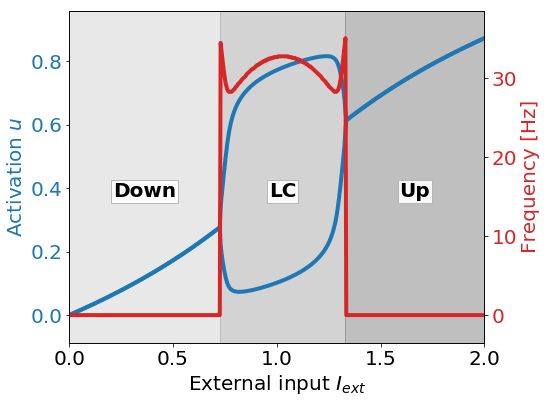

In [38]:
sglParams = load_parameters(singleNode=True, globalN=0)
bifur_diag(sglParams)

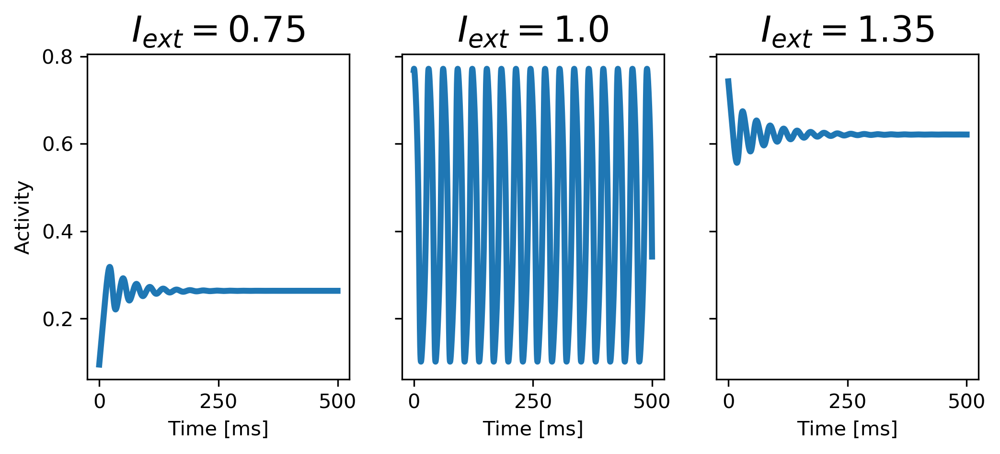

In [5]:
sglParams = load_parameters(singleNode=True, globalN=0)
sglParams['duration']=520
sglParams['I']=0.7
_,xslo,_,_,_,_ = timeIntegrationRK4(sglParams,randomseed=42)
sglParams['I']=1.
_,xslc,_,_,_,_ = timeIntegrationRK4(sglParams,randomseed=42)
sglParams['I']=1.35
_,xshi,_,_,_,_ = timeIntegrationRK4(sglParams,randomseed=42)
fig, ax = plt.subplots(1,3, dpi=300, sharey=True, figsize=(8,3))
plt.rcParams['font.size'] = 15
ax[0].plot(xslo[0,200:], linewidth=3)
ax[0].set_title(r'$I_{ext}=0.75$'); ax[0].set_ylabel('Activity')
ax[1].plot(xslc[0,200:], linewidth=3)
ax[1].set_title(r'$I_{ext}=1.0$')
ax[2].plot(xshi[0,200:], linewidth=3)
ax[2].set_title(r'$I_{ext}=1.35$')
for a in ax:
    a.set(xticks=[0,2500,5000],xticklabels=[0,250,500], xlabel='Time [ms]')


## Data
We use DTI data from the Human Connectome Project and perform probabilistic fiber tracking with FSL. The here used structural connectivity matrix is the average over 12 male young adults (25-30yrs).

HCP IDs of subjects: '101309', '121416', '211215', '211619', '212116', '213522', '219231', '220721', '268749', '284646', '303119', '329844'

In [6]:
# load data
par = load_parameters()

'\nim=ax[1].imshow(par[\'DM\'], cmap=\'plasma\')\nax[1].set(title=\'Fiber Length Matrix\', xlabel=\'Node\', xticks=[0,30,60,90])\ndivider = make_axes_locatable(ax[1])\ncax = divider.append_axes("right", size="5%", pad=0.05)\nfig.colorbar(im, cax = cax)\nplt.tight_layout()\n'

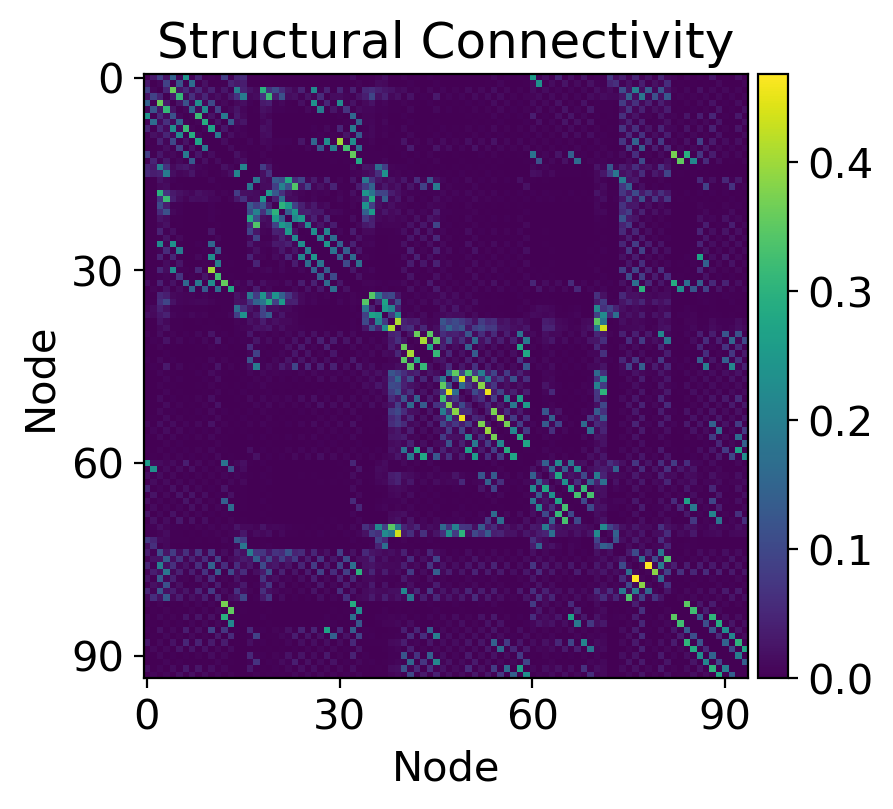

In [7]:
fig, ax = plt.subplots(1,1, dpi=200, sharey=True)
im=ax.imshow(par['SC'])
ax.set(title='Structural Connectivity', xlabel='Node', ylabel='Node', yticks=[0,30,60,90], xticks=[0,30,60,90])
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
fig.colorbar(im, cax = cax)
'''
im=ax[1].imshow(par['DM'], cmap='plasma')
ax[1].set(title='Fiber Length Matrix', xlabel='Node', xticks=[0,30,60,90])
divider = make_axes_locatable(ax[1])
cax = divider.append_axes("right", size="5%", pad=0.05)
fig.colorbar(im, cax = cax)
plt.tight_layout()
'''

Weakest to strongest:  [72 25 31 73 83  1 68 57 82 79 29  7  9 65 24 27 66 90 91 67 93 69 87  0
 78 30 14 61  6 89 56 64 63 13 28 62 15  8 85 11 55 60 42  5 23 26 86 44
 36 20 58 43 92 22 84 12 50 16 59 33 48  4 88 51 52 10 19 74 17 53 81 34
 18 21 80 46 54 40 75 37 49 32 38 45 35 47  3 41 76  2 39 70 77 71]


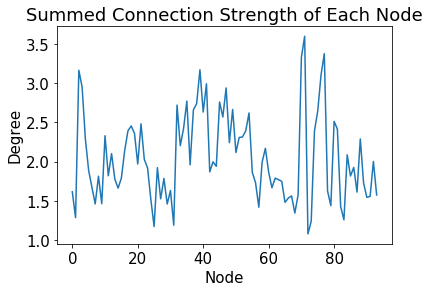

In [8]:
plt.plot(np.sum(par['SC'],axis=0))
plt.xlabel('Node'); plt.ylabel('Degree')
plt.title('Summed Connection Strength of Each Node')
print('Weakest to strongest: ', np.argsort(np.sum(par['SC'],axis=0)))

## Baseline correlation without stimulation

In [9]:
tstart=20000 # in unit of timesteps dt

In [34]:
par['duration']

3000

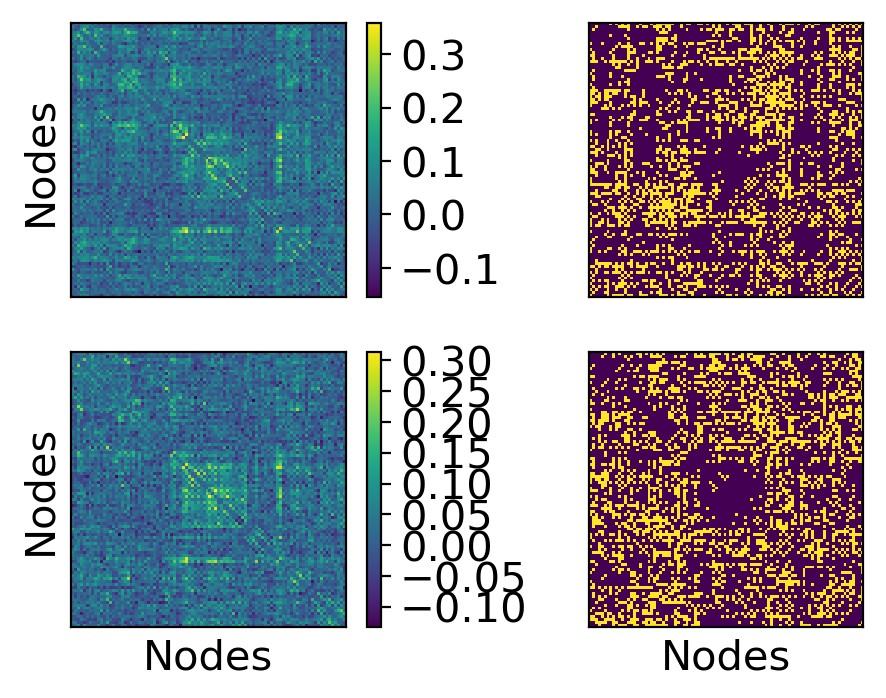

In [36]:
par = load_parameters()
par['K'] = 0.1
par['I'] = 0.52
par['sigma'] = 0.00001
par['duration'] = 20000
_, xs_base, _,_,_,_ = timeIntegrationRK4(par,randomseed=42)
PC_base = np.corrcoef(xs_base[:,-tstart:])
np.fill_diagonal(PC_base,0)
_, xs_base1, _,_,_,_ = timeIntegrationRK4(par,randomseed=1)
PC_base1 = np.corrcoef(xs_base1[:,-tstart:])
np.fill_diagonal(PC_base1,0)

fig, axs = plt.subplots(2,2, dpi=200, sharex=True, sharey=True)
im0 = axs[0,0].imshow(PC_base)
fig.colorbar(im0, ax=axs[0,0])
axs[0,1].imshow(PC_base<0)
im1 = axs[1,0].imshow(PC_base1)
fig.colorbar(im1, ax=axs[1,0])
axs[1,1].imshow(PC_base1<0)
for i, ax in enumerate(axs.ravel()):
    ax.set(xticks=[], yticks=[])
    if i>1: ax.set(xlabel='Nodes')
    if i%2==0: ax.set(ylabel='Nodes')

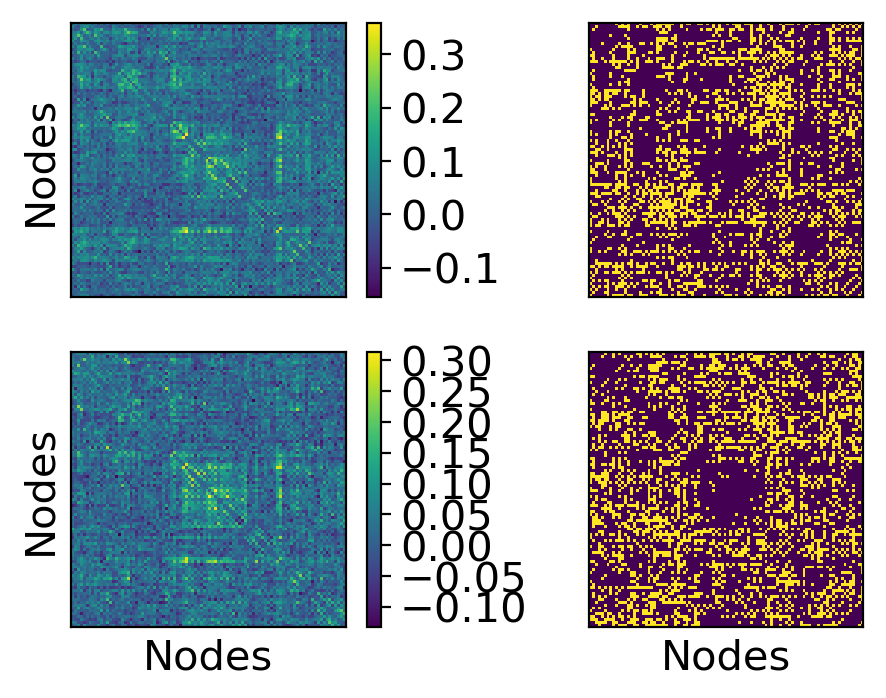

In [42]:
par = load_parameters()
par['K'] = 0.1
par['I'] = 0.52
par['sigma'] = 0.00001
par['duration'] = 20000
_, xs_base, _,_,_,_ = timeIntegrationRK4(par,randomseed=42)
PC_base = np.corrcoef(xs_base[:,-tstart:])
np.fill_diagonal(PC_base,0)
_, xs_base1, _,_,_,_ = timeIntegrationRK4(par,randomseed=1)
PC_base1 = np.corrcoef(xs_base1[:,-tstart:])
np.fill_diagonal(PC_base1,0)

fig, axs = plt.subplots(2,2, dpi=200, sharex=True, sharey=True)
im0 = axs[0,0].imshow(PC_base)
fig.colorbar(im0, ax=axs[0,0])
axs[0,1].imshow(PC_base<0)
im1 = axs[1,0].imshow(PC_base1)
fig.colorbar(im1, ax=axs[1,0])
axs[1,1].imshow(PC_base1<0)
for i, ax in enumerate(axs.ravel()):
    ax.set(xticks=[], yticks=[])
    if i>1: ax.set(xlabel='Nodes')
    if i%2==0: ax.set(ylabel='Nodes')

In [45]:
print(np.sum(PC_base>0), np.sum(PC_base<0))
print(np.sum(PC_base1>0), np.sum(PC_base1<0))

6280 2462
6066 2676


## Stimulate Individual Nodes

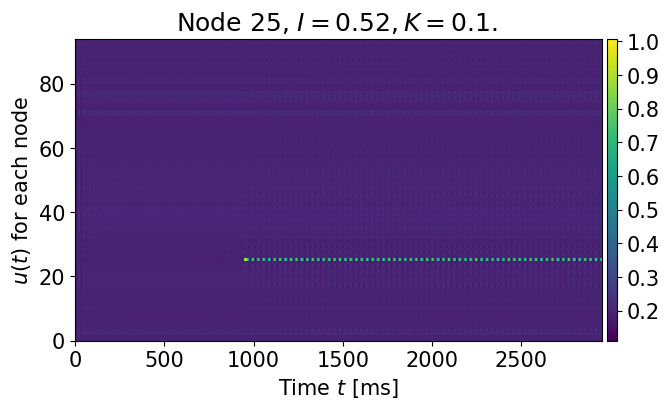

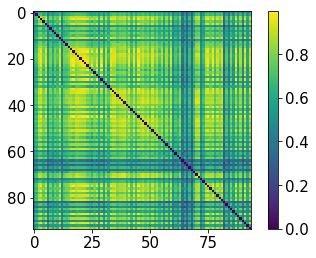

In [11]:
par = load_parameters()
par['K'] = 0.1
par['I'] = 0.52
par['sigma'] = 0.001
_,xs25,_,_,_,_ = timeIntegrationRK4(par, randomseed=42, stimNode=25)
plotSpikeTrain_ini(xs25[:,500:], par, 'Node 25, ')

PC25 = np.corrcoef(xs25[:,tstart:])
np.fill_diagonal(PC25,0)
plt.imshow(PC25); plt.colorbar()

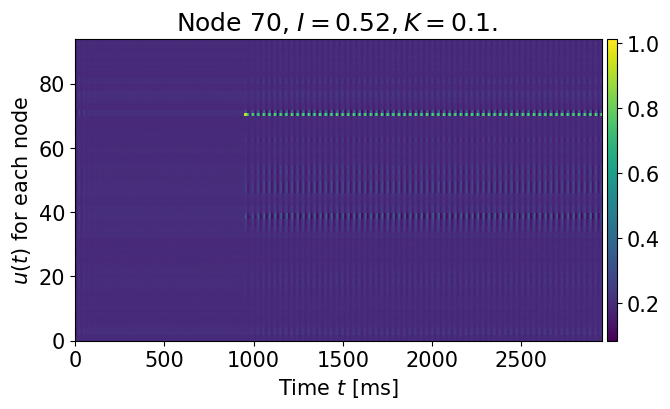

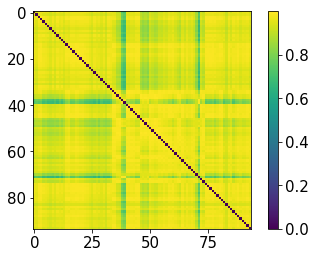

In [12]:
par = load_parameters()
par['K'] = 0.1
par['I'] = 0.52
par['sigma'] = 0.001
_,xs70,_,_,_,_ = timeIntegrationRK4(par, randomseed=42, stimNode=70)
plotSpikeTrain_ini(xs70[:,500:], par, 'Node 70, ')

PC70 = np.corrcoef(xs70[:,tstart:])
np.fill_diagonal(PC70,0)
plt.imshow(PC70); plt.colorbar()

# Functional Effect

0.884223099017001

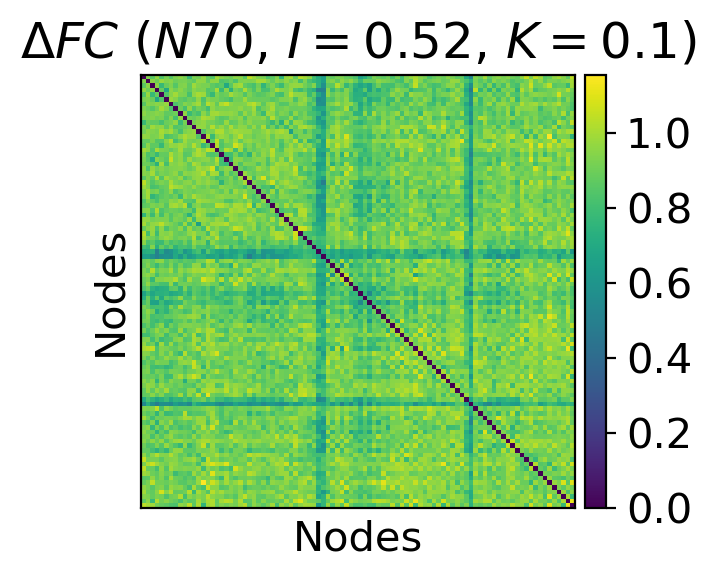

In [15]:
functional_effect(xs_base,xs70,70,tstart)

### Note: $\Delta FC > 1$ is possible since $PC_{base}<0$ in some entries
# The results for $\Delta FC$ are dependend on the choice of x_base (different random seed...)

0.6373363465564681

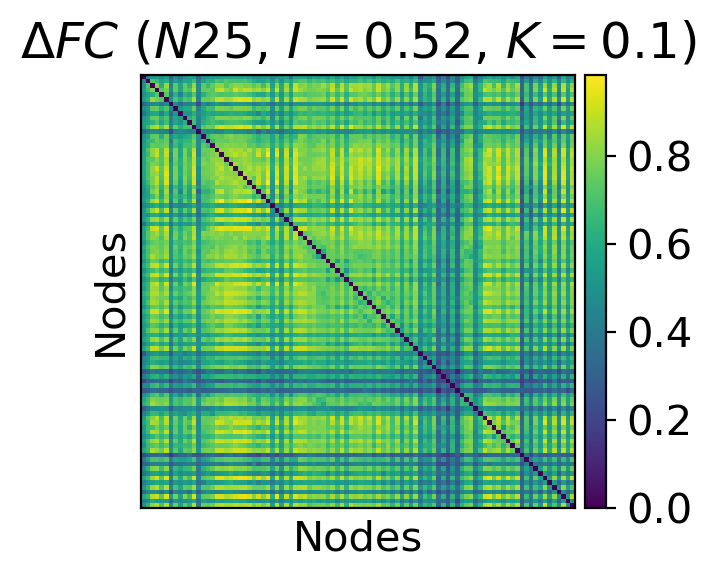

In [47]:
functional_effect(xs_base,xs25,25,tstart)

In [52]:
par = load_parameters()
par['K'] = 0.1
par['I'] = 0.52
par['sigma'] = 0.001
print(par['duration'])

3000


In [71]:
try:
    fes = np.load('fes_avSC_base20sec-s42.npy')
    print('loaded data.')
except:
    print('recompute data...')
    fes = []
    for n in tqdm_notebook(range(par['SC'].shape[0])):
        _,xs,_,_,_,_ = timeIntegrationRK4(par, randomseed=42, stimNode=n)
        fes.append(functional_effect(xs_base,xs,n,tstart,plot=False))
    np.save('fes_avSC_base20sec-s42.npy', fes)

loaded data.


In [58]:
mpl.style.use('default')

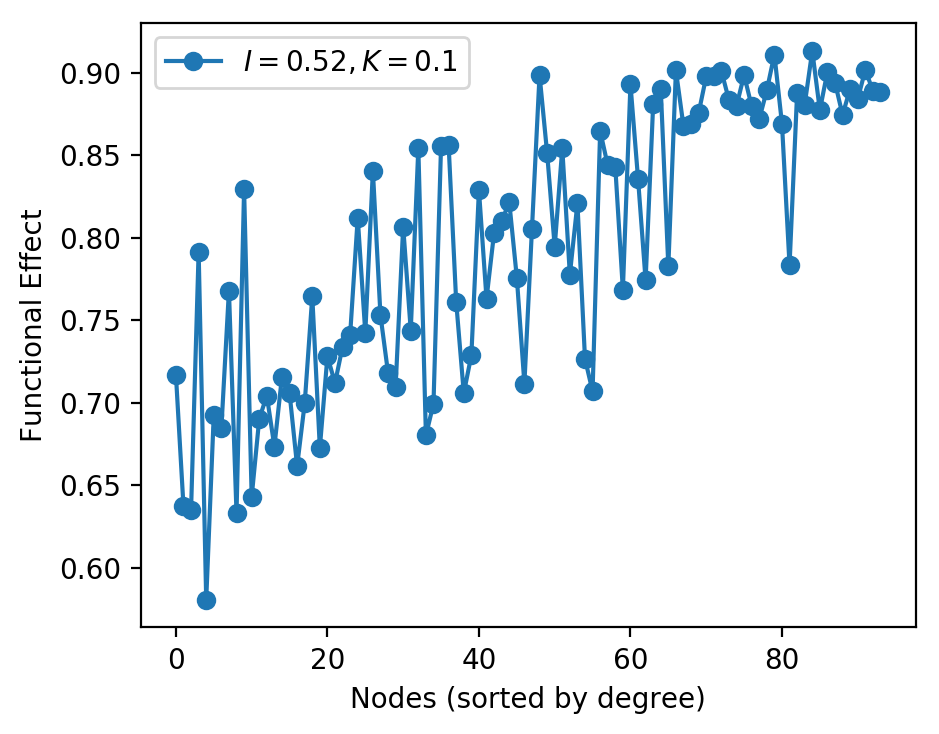

In [72]:
plt.figure(figsize=(5,4), dpi=200)
plt.plot(np.asarray(fes)[np.argsort(np.sum(par['SC'],axis=1))], 'o-',label=r'$I={}, K={}$'.format(par['I'],par['K']))
plt.xlabel('Nodes (sorted by degree)')
plt.ylabel('Functional Effect')
plt.legend();plt.show()

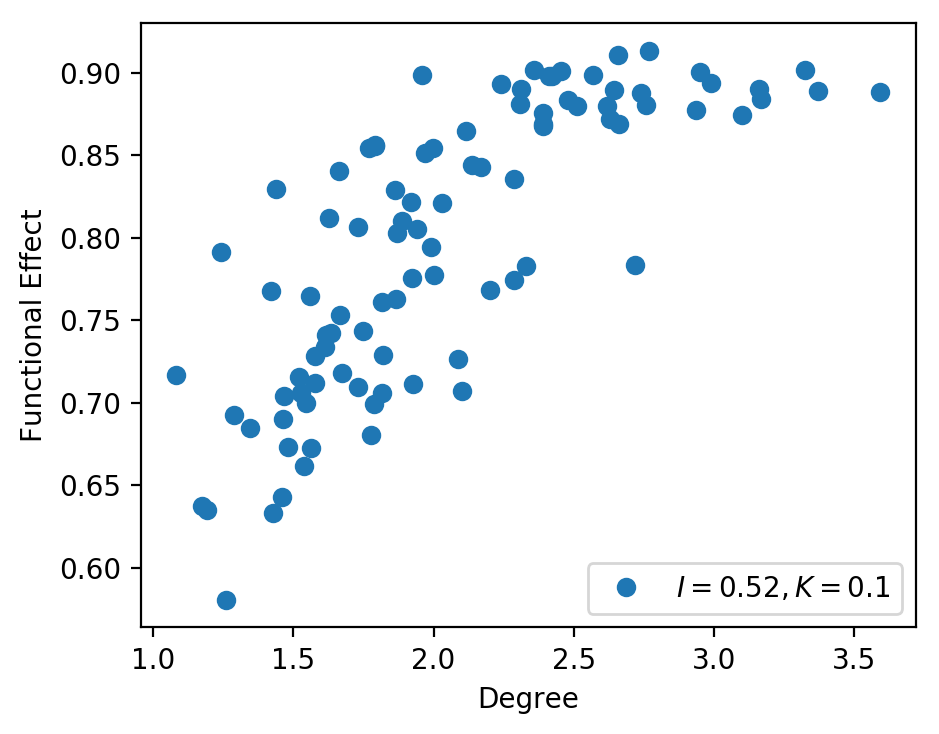

In [61]:
plt.figure(figsize=(5,4), dpi=200)
plt.plot(np.sum(par['SC'],axis=0),np.asarray(fes), 'o',label=r'$I={}, K={}$'.format(par['I'],par['K']))
plt.xlabel('Degree')
plt.ylabel('Functional Effect')
plt.legend();plt.show()

## Modal Controllability

Text(0.5,0,'Node')

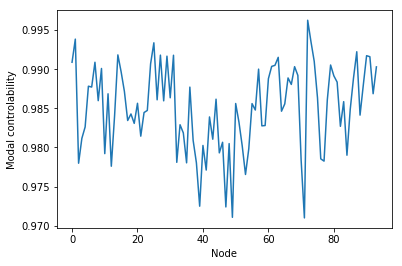

In [62]:
modal = calc_mod_control(par['SC']/2/np.linalg.eigvals(par['SC']).max()) 
# previously forgot the normalization by 2*lam_max
plt.plot(modal)
plt.ylabel('Modal controlability')
plt.xlabel('Node')

In [73]:
np.linalg.eigvals(par['SC']).max()

2.2767427359677455

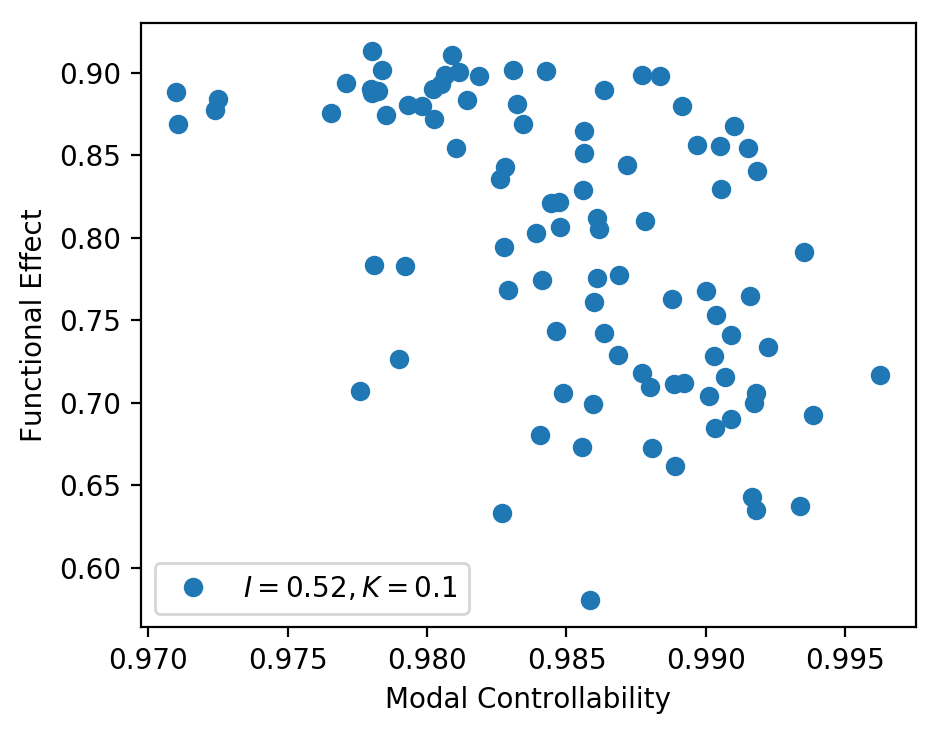

In [74]:
plt.figure(figsize=(5,4), dpi=200)
plt.plot(modal,np.asarray(fes), 'o',label=r'$I={}, K={}$'.format(par['I'],par['K']))
plt.xlabel('Modal Controllability')
plt.ylabel('Functional Effect')
plt.legend();plt.show()

## Average Controllability

Text(0.5,0,'Node')

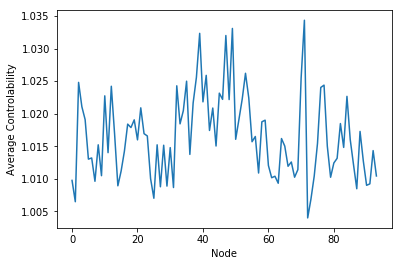

In [75]:
ave_control = calc_ave_control(par['SC']/2/np.linalg.eigvals(par['SC']).max()) 
plt.plot(ave_control)
plt.ylabel('Average Controlability')
plt.xlabel('Node')

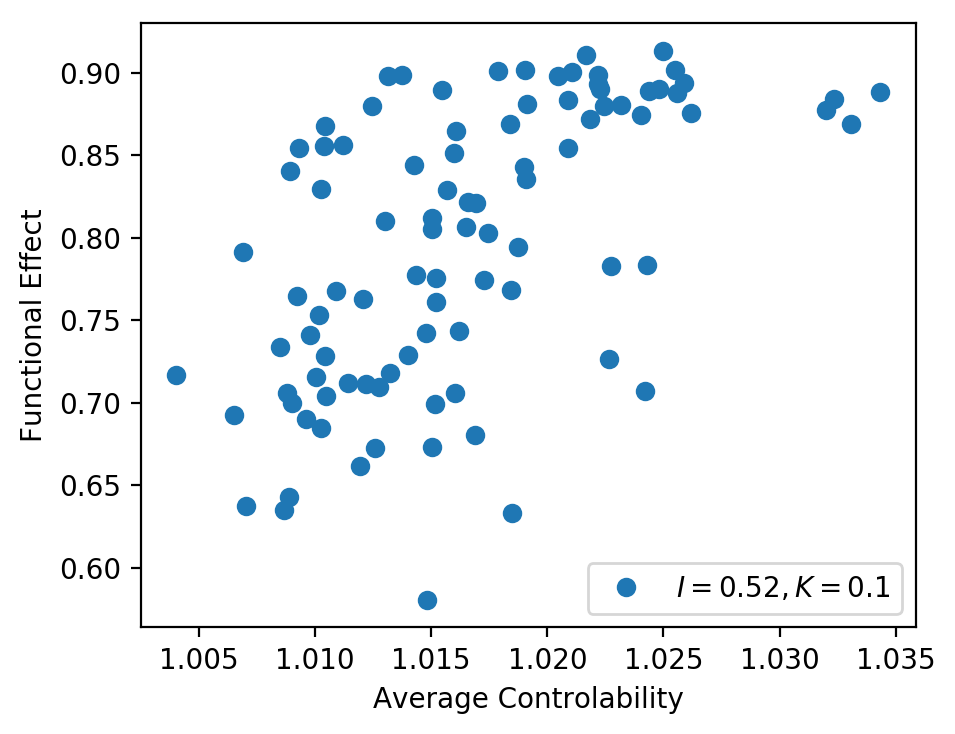

In [76]:
plt.figure(figsize=(5,4), dpi=200)
plt.plot(ave_control,np.asarray(fes), 'o',label=r'$I={}, K={}$'.format(par['I'],par['K']))
plt.xlabel('Average Controlability')
plt.ylabel('Functional Effect')
plt.legend();plt.show()

# Structural Effect

Definition in the method section: _In order to assess how the structural brain connectivity constrains network dynamics, we calculate the similarity, defined by the 2-dimensional correlation coefficient, between the structural connectivity matrix used as a basis of the simulation and the functional matrix describing the resultant brain state. This calculation is done first using the initial functional brain state before stimulation, and then using the functional brain state during the stimulation period. Stimulation of a single region increases the similarity between the structural connectivity and functional brain state, and we quantify this increase, termed the structural effect, by subtracting the correlation obtained before stimulation from that obtained during stimulation. Thus, a high structural effect indicates that the underlying connectivity structure constrains the functional effects of stimulation to this region._

Result from the paper: _the relationship between the structural effect and regional controllability is opposite that of the functional effect and controllability. Stimulation of regions with a high average controllability results in a smaller structural effect, while stimulation of regions with a high modal controllability results in a higher structural effect_.


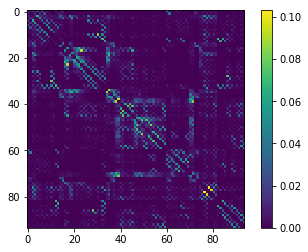

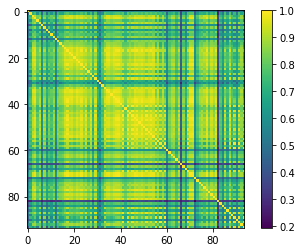

In [235]:
plt.imshow(SCs[-1]);plt.colorbar();plt.show()
stimcor = np.corrcoef(xs_stim[:,tstart:])
plt.imshow(stimcor);plt.colorbar();plt.show()

In [240]:
tridx = np.triu_indices(94)

In [241]:
np.corrcoef(SCs[-1][tridx],stimcor[tridx])

array([[1.        , 0.19848194],
       [0.19848194, 1.        ]])

In [244]:
np.corrcoef(SCs[-1][tridx],np.corrcoef(xs_base[:,tstart:])[tridx])

array([[1.        , 0.17552291],
       [0.17552291, 1.        ]])

In [257]:
def structural_effect(SC, xs_stim, tstart, xs_base=None, basecor=None):
    tridx = np.triu_indices(SC.shape[0])
    stimcor = np.corrcoef(xs_stim[:,tstart:])
    scCorStim = np.corrcoef(SC[tridx], stimcor[tridx])
    if basecor.any() != None:
        scCorBase = np.corrcoef(SC[tridx], basecor[tridx])
    else:
        scCorBase = np.corrcoef(SC[tridx], np.corrcoef(xs_base[:,tstart:])[tridx])
    return scCorStim[0,1] - scCorBase[0,1]

def WRONG_structural_effect_comp(SC, baseCorrelation, maxCorrelation, xs_stim, tstart):
    se = correlate2d(SC,np.corrcoef(xs_stim[:,tstart:]),mode='valid')[0][0] - baseCorrelation
    # baseCorrelation = correlate2d(SC,np.corrcoef(xs_base[:,tstart:]),mode='valid')
    return se/maxCorrelation


In [79]:
maxCorrelation = correlate2d(par['SC'],np.ones((94,94)),mode='valid')
print(maxCorrelation)

[[193.1330883]]


In [81]:
fullCorrelation = correlate2d(par['SC'],par['SC'],mode='valid')
print(fullCorrelation)

[[29.12281473]]


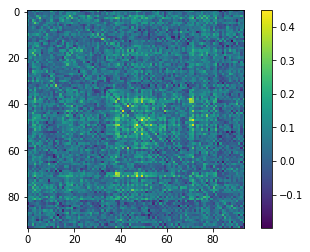











  0%|          | 0/94 [00:00<?, ?it/s]

recompute data...












  1%|          | 1/94 [00:03<06:06,  3.95s/it]









  2%|▏         | 2/94 [00:07<06:01,  3.93s/it]









  3%|▎         | 3/94 [00:11<05:57,  3.93s/it]









  4%|▍         | 4/94 [00:15<05:54,  3.94s/it]









  5%|▌         | 5/94 [00:19<05:51,  3.95s/it]









  6%|▋         | 6/94 [00:23<05:46,  3.93s/it]









  7%|▋         | 7/94 [00:27<05:43,  3.94s/it]









  9%|▊         | 8/94 [00:31<05:38,  3.94s/it]









 10%|▉         | 9/94 [00:35<05:34,  3.93s/it]









 11%|█         | 10/94 [00:39<05:30,  3.93s/it]









 12%|█▏        | 11/94 [00:43<05:27,  3.95s/it]









 13%|█▎        | 12/94 [00:47<05:24,  3.96s/it]









 14%|█▍        | 13/94 [00:51<05:19,  3.94s/it]









 15%|█▍        | 14/94 [00:55<05:15,  3.94s/it]









 16%|█▌        | 15/94 [00:59<05:10,  3.93s/it]









 17%|█▋        | 16/94 [01:02<05:06,  3.93s/it]









 18%|█▊        | 17/94 [01:06<05:01,  3.92s/it]









 19%|█▉        | 18/94 [01:10<

In [246]:
par = load_parameters()
par['K'] = 0.1
par['I'] = 0.52
par['sigma'] = 0.001
tstart=20000 # in unit of timesteps dt

_, xs_base, _,_,_,_ = timeIntegrationRK4(par,randomseed=42)
PC_base = np.corrcoef(xs_base[:,tstart:])
np.fill_diagonal(PC_base,0)
plt.imshow(PC_base)
plt.colorbar(); plt.show()

try:
    ses = np.load('ses_avSC_maxnorm_base20sec-s42.npy')
    print('loaded data.')
except:
    print('recompute data...')    
    ses = []
    for n in tqdm_notebook(range(par['SC'].shape[0])):
        _,xs,_,_,_,_ = timeIntegrationRK4(par, randomseed=42, stimNode=n)
        ses.append(structural_effect(par['SC'],xs,tstart,xs_base))


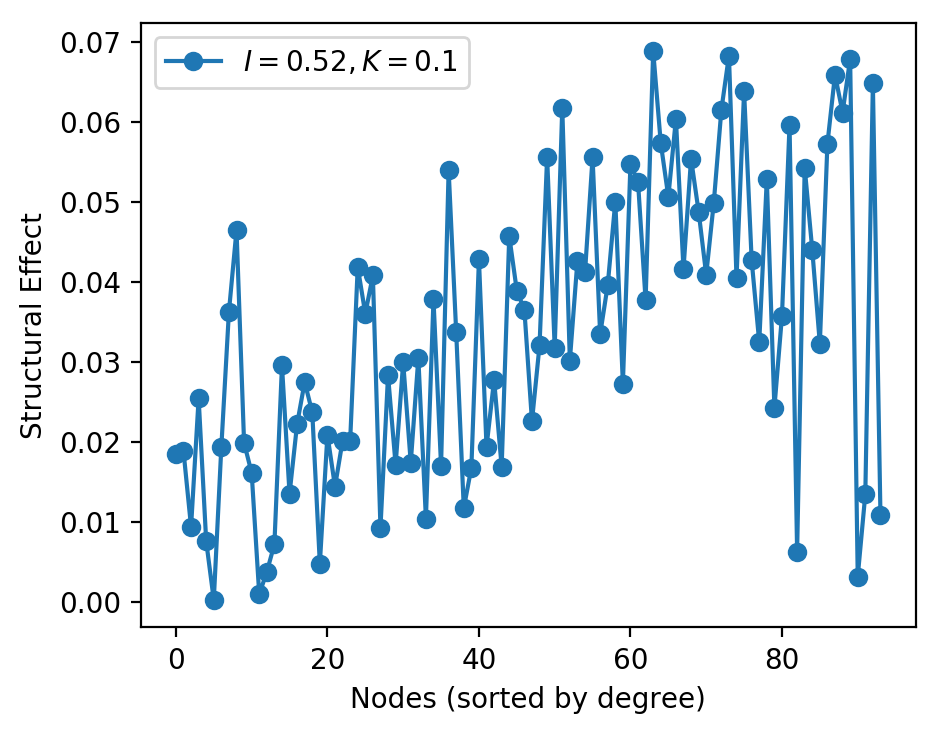

In [247]:
plt.figure(figsize=(5,4), dpi=200)
plt.plot(np.asarray(ses)[np.argsort(np.sum(par['SC'],axis=1))], 'o-',label=r'$I={}, K={}$'.format(par['I'],par['K']))
plt.xlabel('Nodes (sorted by degree)')
plt.ylabel('Structural Effect')
plt.legend();plt.show()

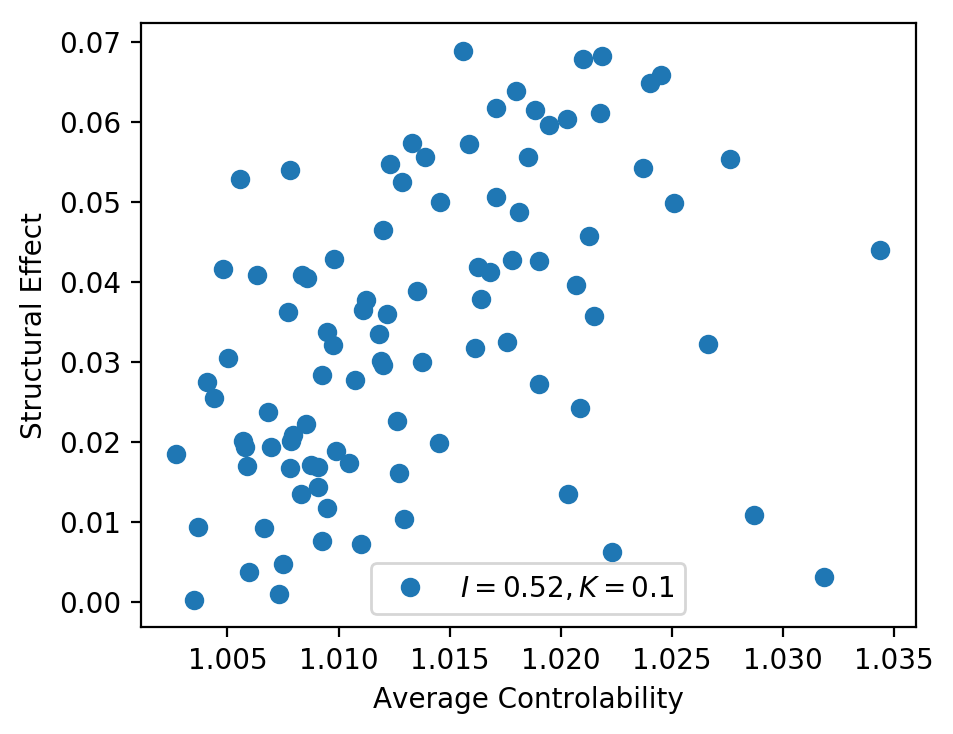

In [248]:
plt.figure(figsize=(5,4), dpi=200)
plt.plot(ave_control,np.asarray(ses), 'o',label=r'$I={}, K={}$'.format(par['I'],par['K']))
plt.xlabel('Average Controlability')
plt.ylabel('Structural Effect')
plt.legend();plt.show()

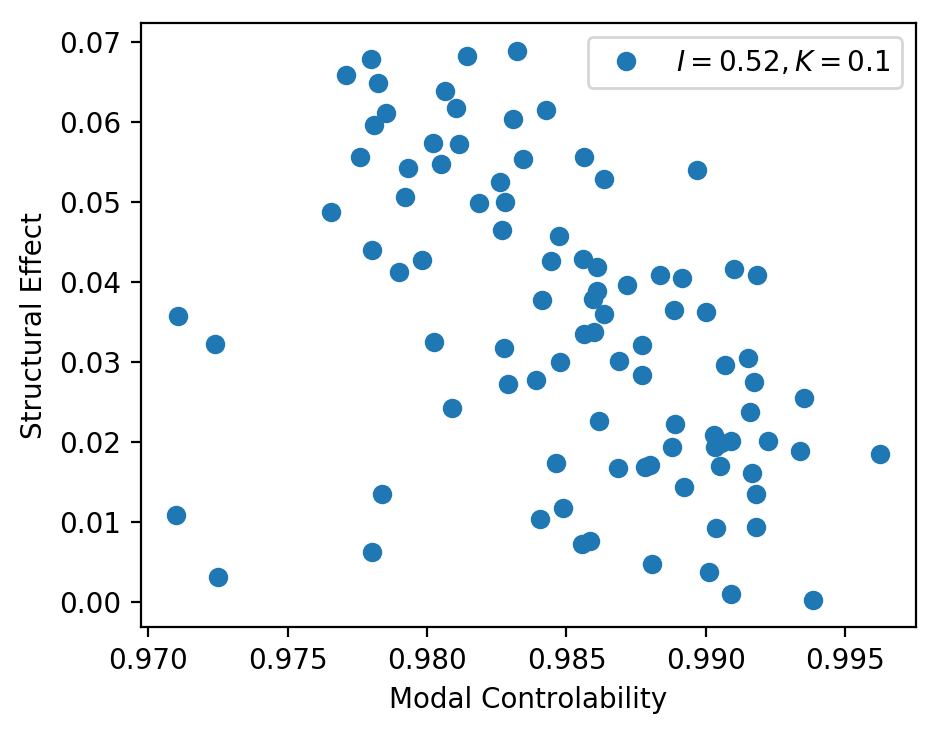

In [249]:
plt.figure(figsize=(5,4), dpi=200)
plt.plot(modal,np.asarray(ses), 'o',label=r'$I={}, K={}$'.format(par['I'],par['K']))
plt.xlabel('Modal Controlability')
plt.ylabel('Structural Effect')
plt.legend();plt.show()

# Individual subjects

In [91]:
SCs = np.load('SCs_m12_94_voxNorm.npy')

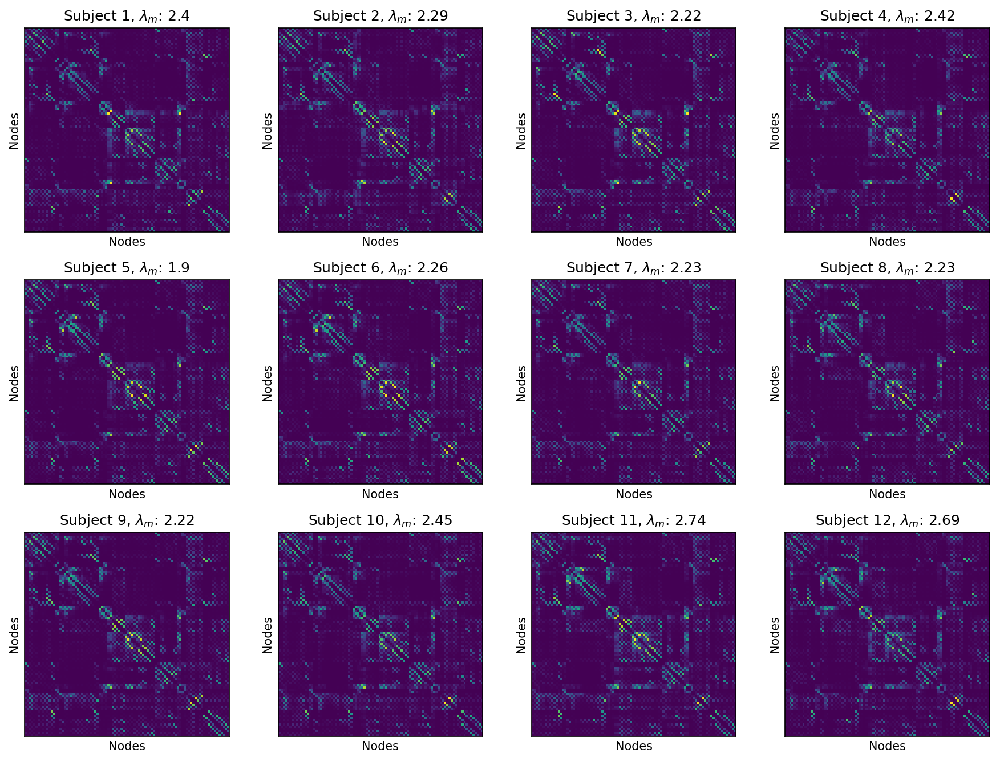

In [92]:
evs = []
fig, axs = plt.subplots(3,4,sharex=True, sharey=True, dpi=150,figsize=(12,9))
for i, ax in enumerate(axs.ravel()):
    ax.imshow(SCs[i])
    ev = np.max(np.linalg.eig(SCs[i])[0])
    evs.append(ev)
    ax.set(title=r'Subject {}, $\lambda_m$: {}'.format(i+1, np.round(ev,2)), xlabel='Nodes', ylabel='Nodes', xticks=[], yticks=[])
plt.tight_layout()

Following the normalization procedure dscribed in the supplementary: https://journals.plos.org/ploscompbiol/article/file?id=10.1371/journal.pcbi.1005076.s007&type=supplementary

In [93]:
evmax = max(evs)
print(evmax)
SCs = SCs/(2*evmax)

2.7358853335443496


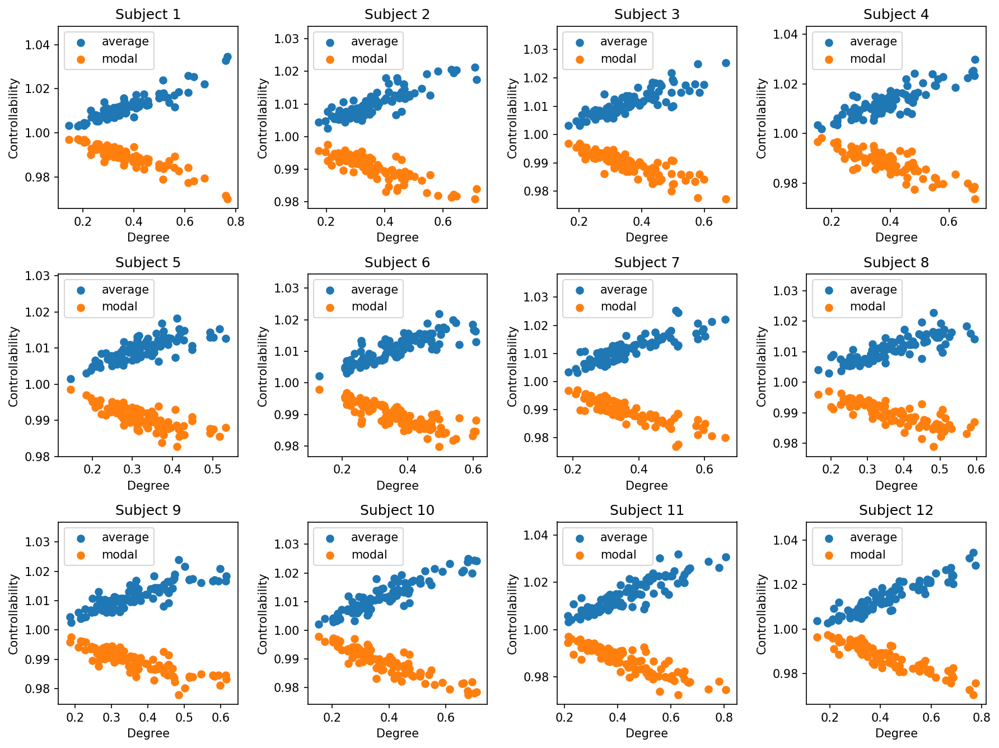

In [94]:
aves = []
mods = []
degs = []
fig, axs = plt.subplots(3,4, dpi=150,figsize=(12,9))
for i, ax in enumerate(axs.ravel()):
    ave_control = calc_ave_control(SCs[i])
    aves.append(ave_control)
    mod_control = calc_mod_control(SCs[i])
    mods.append(mod_control)
    degree = np.sum(SCs[i],axis=0)
    degs.append(degree)
    ax.scatter(degree, ave_control,label='average')
    ax.scatter(degree, mod_control,label='modal')
    ax.set(title=r'Subject {}'.format(i+1), xlabel='Degree', ylabel='Controllability')
    ax.legend(loc=2)
plt.tight_layout()

## Figure 3. Linear regional controllability.

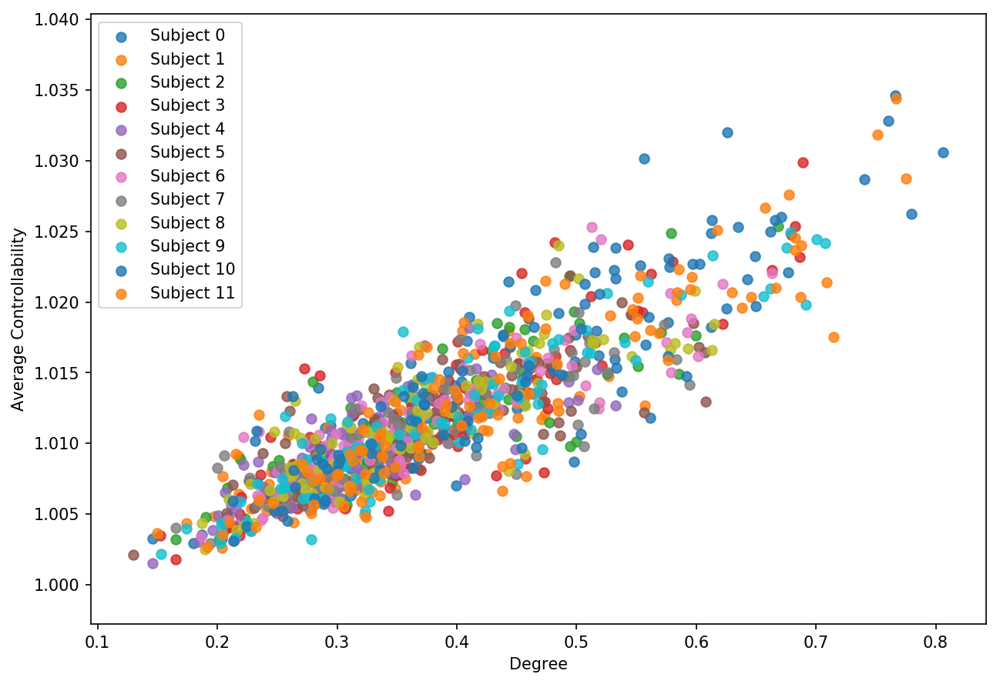

In [95]:
fig, ax = plt.subplots(figsize=(10,7),dpi=150)
for i in range(len(degs)):
    ax.scatter(degs[i],aves[i],  label='Subject {}'.format(i), alpha=0.8)
    ax.legend()
ax.set(ylabel='Average Controllability', xlabel='Degree')
plt.show()

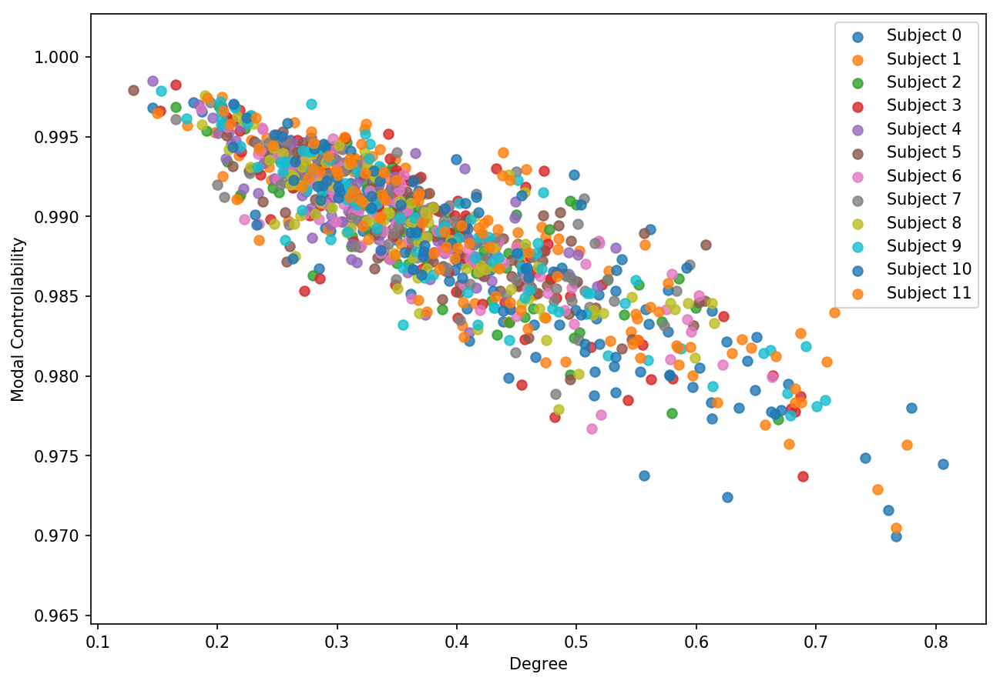

In [96]:
fig, ax = plt.subplots(figsize=(10,7),dpi=150)
for i in range(len(degs)):
    ax.scatter(degs[i],mods[i], label='Subject {}'.format(i), alpha=0.8)
    ax.legend()
ax.set(ylabel='Modal Controllability', xlabel='Degree')
plt.show()

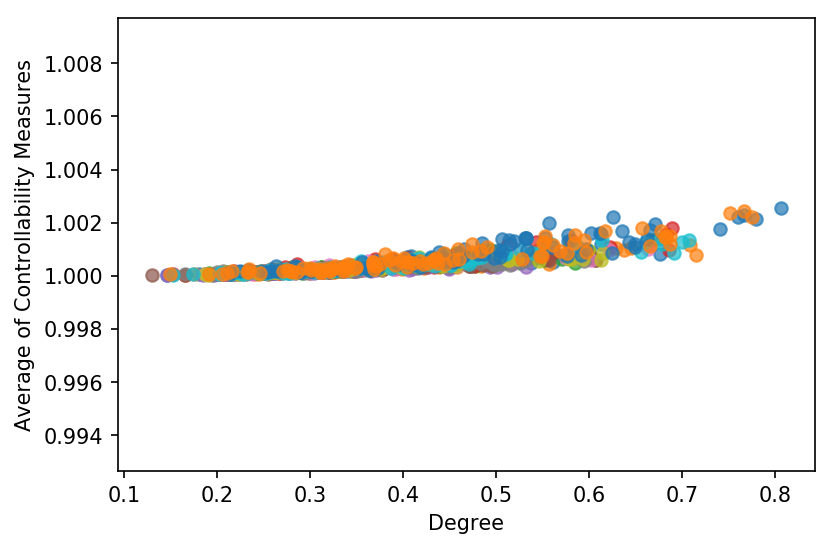

In [98]:
# Sanity check:
fig, ax = plt.subplots(dpi=150)
for i in range(len(degs)):
    ax.scatter(degs[i],(mods[i]+aves[i])/2,  label='Subject {}'.format(i), alpha=0.7)
    #ax.legend()
ax.set(ylabel='Average of Controllability Measures', xlabel='Degree')
plt.show()

## Find transition points for each subject
Fundamental difference is that their model only has one input parameter. Figure 2c) checks when different matrices transition (8 subjects, 3 scans per subject).

Use 3 different background inputs, $I_{ext} \in [0.5,0.6,0.7]$

In [102]:
a = [1,2,3]
b = [1,2,3]
c = [11,21,31]
d = [a,b,c]

In [103]:
np.mean(d, axis=0)

array([ 4.33333333,  8.33333333, 12.33333333])


0it [00:00, ?it/s]

recompute data...
Subject 1: 1e-1 Accuracy found! 0.7
Subject 1: 1e-2 Accuracy found! 0.63
Subject 1: 1e-3 Accuracy found! 0.628
Subject 1: 1e-1 Accuracy found! 0.7
Subject 1: 1e-2 Accuracy found! 0.64
Subject 1: 1e-3 Accuracy found! 0.631
Subject 1: 1e-1 Accuracy found! 0.7
Subject 1: 1e-2 Accuracy found! 0.64
Subject 1: 1e-3 Accuracy found! 0.631


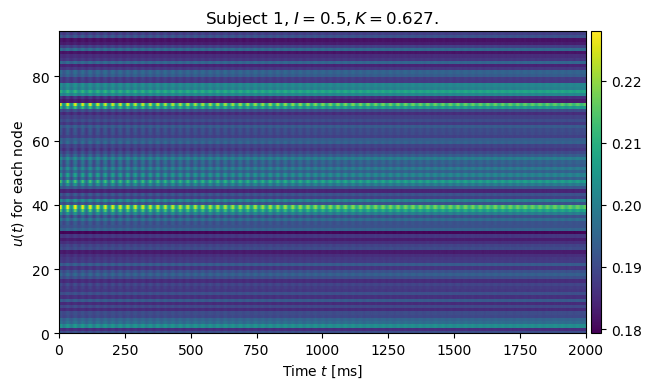


1it [02:54, 174.89s/it]

Subject 2: 1e-1 Accuracy found! 0.7
Subject 2: 1e-2 Accuracy found! 0.67
Subject 2: 1e-3 Accuracy found! 0.67
Subject 2: 1e-1 Accuracy found! 0.7
Subject 2: 1e-2 Accuracy found! 0.68
Subject 2: 1e-3 Accuracy found! 0.673
Subject 2: 1e-1 Accuracy found! 0.7
Subject 2: 1e-2 Accuracy found! 0.68
Subject 2: 1e-3 Accuracy found! 0.673


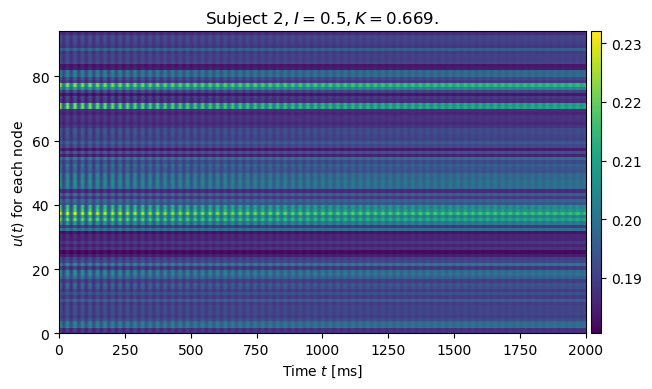


2it [06:51, 193.50s/it]

Subject 3: 1e-1 Accuracy found! 0.7
Subject 3: 1e-2 Accuracy found! 0.7000000000000001
Subject 3: 1e-3 Accuracy found! 0.6990000000000001
Subject 3: 1e-1 Accuracy found! 0.7999999999999999
Subject 3: 1e-2 Accuracy found! 0.71
Subject 3: 1e-3 Accuracy found! 0.701
Subject 3: 1e-1 Accuracy found! 0.7999999999999999
Subject 3: 1e-2 Accuracy found! 0.71
Subject 3: 1e-3 Accuracy found! 0.702


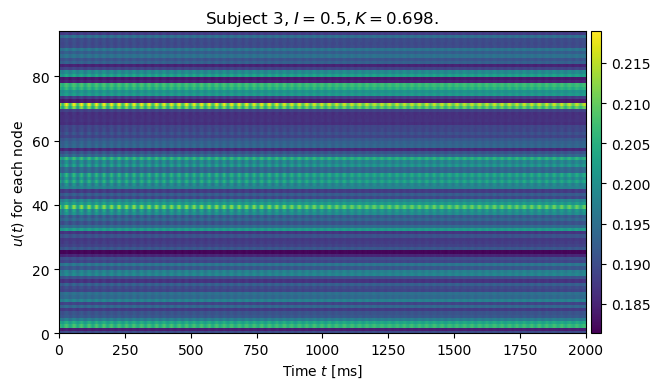


3it [09:58, 191.31s/it]

Subject 4: 1e-1 Accuracy found! 0.7
Subject 4: 1e-2 Accuracy found! 0.64
Subject 4: 1e-3 Accuracy found! 0.638
Subject 4: 1e-1 Accuracy found! 0.7
Subject 4: 1e-2 Accuracy found! 0.65
Subject 4: 1e-3 Accuracy found! 0.641
Subject 4: 1e-1 Accuracy found! 0.7
Subject 4: 1e-2 Accuracy found! 0.65
Subject 4: 1e-3 Accuracy found! 0.641


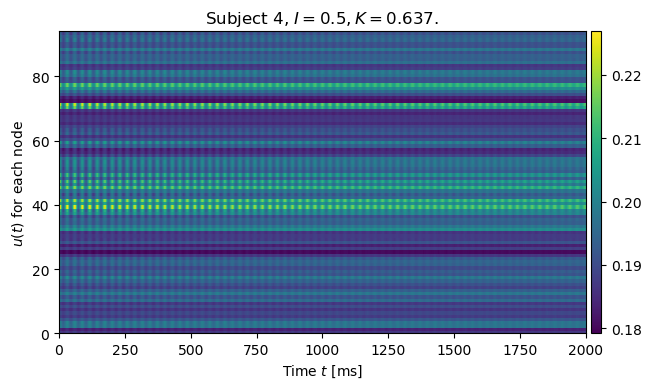


4it [12:57, 187.65s/it]

Subject 5: 1e-1 Accuracy found! 0.8999999999999999
Subject 5: 1e-2 Accuracy found! 0.84
Subject 5: 1e-3 Accuracy found! 0.831
Subject 5: 1e-1 Accuracy found! 0.8999999999999999
Subject 5: 1e-2 Accuracy found! 0.84
Subject 5: 1e-3 Accuracy found! 0.835
Subject 5: 1e-1 Accuracy found! 0.8999999999999999
Subject 5: 1e-2 Accuracy found! 0.84
Subject 5: 1e-3 Accuracy found! 0.835


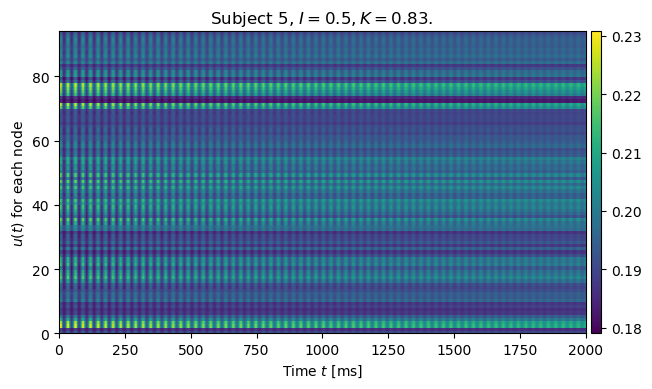


5it [16:14, 190.56s/it]

Subject 6: 1e-1 Accuracy found! 0.7
Subject 6: 1e-2 Accuracy found! 0.7000000000000001
Subject 6: 1e-3 Accuracy found! 0.6960000000000001
Subject 6: 1e-1 Accuracy found! 0.7
Subject 6: 1e-2 Accuracy found! 0.7000000000000001
Subject 6: 1e-3 Accuracy found! 0.6990000000000001
Subject 6: 1e-1 Accuracy found! 0.7
Subject 6: 1e-2 Accuracy found! 0.7000000000000001
Subject 6: 1e-3 Accuracy found! 0.6990000000000001


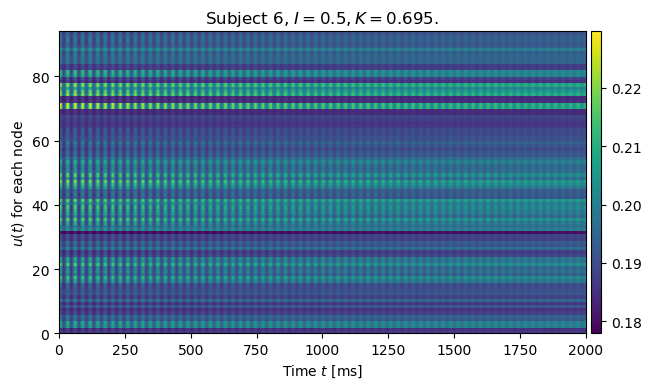


6it [21:03, 220.22s/it]

Subject 7: 1e-1 Accuracy found! 0.7
Subject 7: 1e-2 Accuracy found! 0.7000000000000001
Subject 7: 1e-3 Accuracy found! 0.6990000000000001
Subject 7: 1e-1 Accuracy found! 0.7999999999999999
Subject 7: 1e-2 Accuracy found! 0.71
Subject 7: 1e-3 Accuracy found! 0.702
Subject 7: 1e-1 Accuracy found! 0.7999999999999999
Subject 7: 1e-2 Accuracy found! 0.71
Subject 7: 1e-3 Accuracy found! 0.702


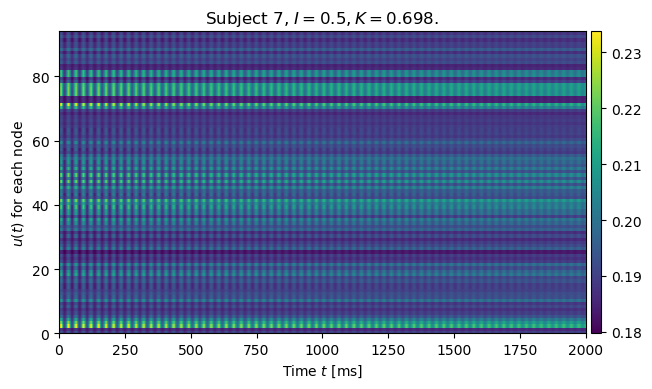


7it [24:16, 211.92s/it]

Subject 8: 1e-1 Accuracy found! 0.7999999999999999
Subject 8: 1e-2 Accuracy found! 0.71
Subject 8: 1e-3 Accuracy found! 0.708
Subject 8: 1e-1 Accuracy found! 0.7999999999999999
Subject 8: 1e-2 Accuracy found! 0.72
Subject 8: 1e-3 Accuracy found! 0.712
Subject 8: 1e-1 Accuracy found! 0.7999999999999999
Subject 8: 1e-2 Accuracy found! 0.72
Subject 8: 1e-3 Accuracy found! 0.712


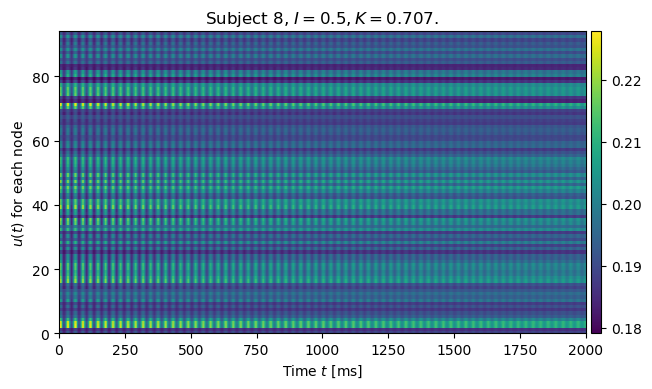


8it [27:01, 197.85s/it]

Subject 9: 1e-1 Accuracy found! 0.7999999999999999
Subject 9: 1e-2 Accuracy found! 0.71
Subject 9: 1e-3 Accuracy found! 0.705
Subject 9: 1e-1 Accuracy found! 0.7999999999999999
Subject 9: 1e-2 Accuracy found! 0.71
Subject 9: 1e-3 Accuracy found! 0.709
Subject 9: 1e-1 Accuracy found! 0.7999999999999999
Subject 9: 1e-2 Accuracy found! 0.71
Subject 9: 1e-3 Accuracy found! 0.709


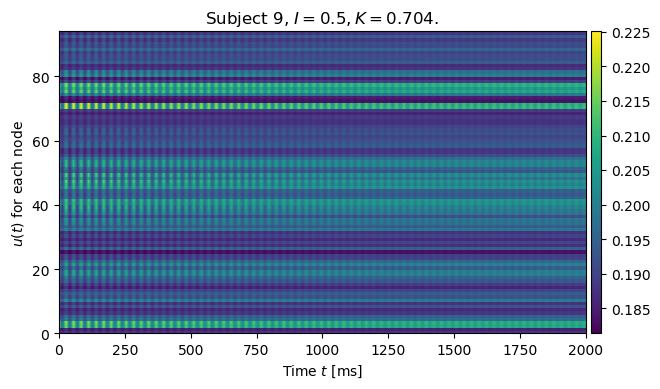


9it [30:18, 197.45s/it]

Subject 10: 1e-1 Accuracy found! 0.7
Subject 10: 1e-2 Accuracy found! 0.64
Subject 10: 1e-3 Accuracy found! 0.631
Subject 10: 1e-1 Accuracy found! 0.7
Subject 10: 1e-2 Accuracy found! 0.64
Subject 10: 1e-3 Accuracy found! 0.634
Subject 10: 1e-1 Accuracy found! 0.7
Subject 10: 1e-2 Accuracy found! 0.64
Subject 10: 1e-3 Accuracy found! 0.634


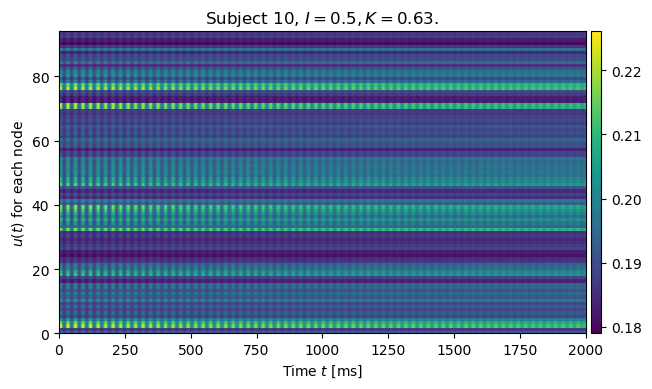


10it [33:02, 187.56s/it]

Subject 11: 1e-1 Accuracy found! 0.6
Subject 11: 1e-2 Accuracy found! 0.5700000000000001
Subject 11: 1e-3 Accuracy found! 0.5690000000000001
Subject 11: 1e-1 Accuracy found! 0.6
Subject 11: 1e-2 Accuracy found! 0.5800000000000001
Subject 11: 1e-3 Accuracy found! 0.5710000000000001
Subject 11: 1e-1 Accuracy found! 0.6
Subject 11: 1e-2 Accuracy found! 0.5800000000000001
Subject 11: 1e-3 Accuracy found! 0.5710000000000001


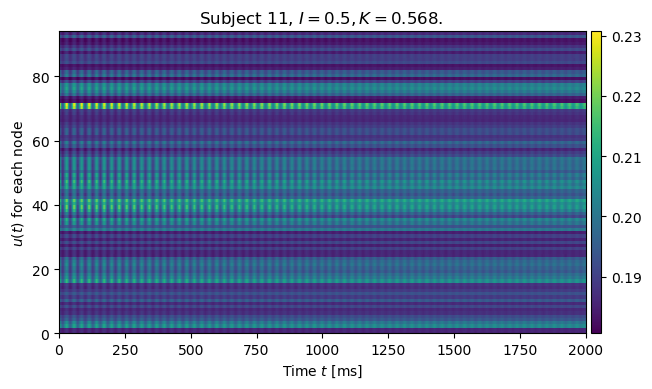


11it [36:24, 191.99s/it]

Subject 12: 1e-1 Accuracy found! 0.6
Subject 12: 1e-2 Accuracy found! 0.5800000000000001
Subject 12: 1e-3 Accuracy found! 0.5740000000000001
Subject 12: 1e-1 Accuracy found! 0.6
Subject 12: 1e-2 Accuracy found! 0.5800000000000001
Subject 12: 1e-3 Accuracy found! 0.5770000000000001
Subject 12: 1e-1 Accuracy found! 0.6
Subject 12: 1e-2 Accuracy found! 0.5800000000000001
Subject 12: 1e-3 Accuracy found! 0.5770000000000001


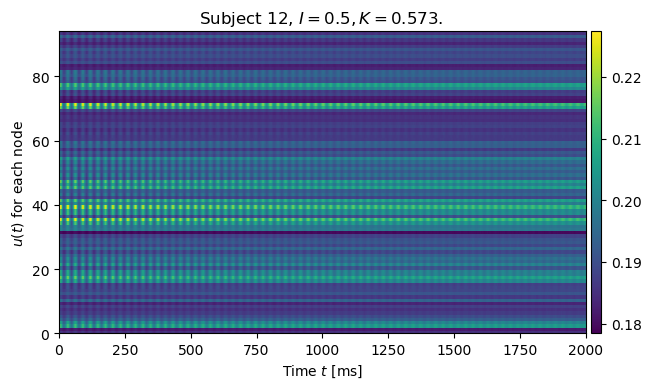


12it [40:17, 204.13s/it]


In [117]:
try:
    transitionK_I05 = np.load('transitionK_allSCs_I05_thres001_s42-1-2.npy')
    print('loaded data.')
except:
    print('recompute data...')    
    par = load_parameters()
    par['sigma'] = 0.0001
    #for i in Is:
    par['I'] = 0.5
    KsI05 = []
    KsI05_seed1 = []
    KsI05_seed2 = []
    for i, SC in tqdm_notebook(enumerate(SCs)):
        par['SC'] = SC
        par['K'] = 0.
        K_I05 = find_k_transition(par,i+1,thres=0.01)
        K_I05_seed1 = find_k_transition(par,i+1,thres=0.08,rs=1)
        K_I05_seed2 = find_k_transition(par,i+1,thres=0.08,rs=2)
        par['K'] = K_I05
        _,xs,_,_,_,_ = timeIntegrationRK4(par, randomseed=42)
        plotSpikeTrain_ini(xs[:,10000:], par, 'Subject {}, '.format(i+1))
        KsI05.append(K_I05)
        KsI05_seed1.append(K_I05_seed1)
        KsI05_seed2.append(K_I05_seed2)
        
    transitionK_I05 = [KsI05, KsI05_seed1, KsI05_seed2]
    np.save('transitionK_allSCs_I05_thres001_s42-1-2.npy', transitionK_I05)










0it [00:00, ?it/s]

recompute data...
Subject 1: 1e-1 Accuracy found! 0.4
Subject 1: 1e-2 Accuracy found! 0.40000000000000013
Subject 1: 1e-3 Accuracy found! 0.39600000000000013
Subject 1: 1e-1 Accuracy found! 0.6
Subject 1: 1e-2 Accuracy found! 0.5900000000000001
Subject 1: 1e-3 Accuracy found! 0.5870000000000001
Subject 1: 1e-1 Accuracy found! 0.6
Subject 1: 1e-2 Accuracy found! 0.52
Subject 1: 1e-3 Accuracy found! 0.517


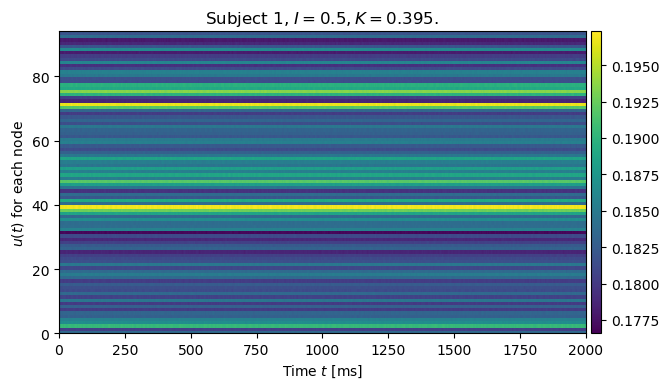

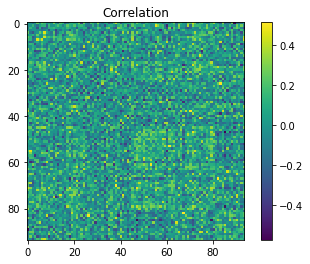










1it [03:55, 235.87s/it]

Subject 2: 1e-1 Accuracy found! 0.4
Subject 2: 1e-2 Accuracy found! 0.3600000000000001
Subject 2: 1e-3 Accuracy found! 0.3600000000000001
Subject 2: 1e-1 Accuracy found! 0.6
Subject 2: 1e-2 Accuracy found! 0.5700000000000001
Subject 2: 1e-3 Accuracy found! 0.5640000000000001
Subject 2: 1e-1 Accuracy found! 0.6
Subject 2: 1e-2 Accuracy found! 0.5800000000000001
Subject 2: 1e-3 Accuracy found! 0.5780000000000001


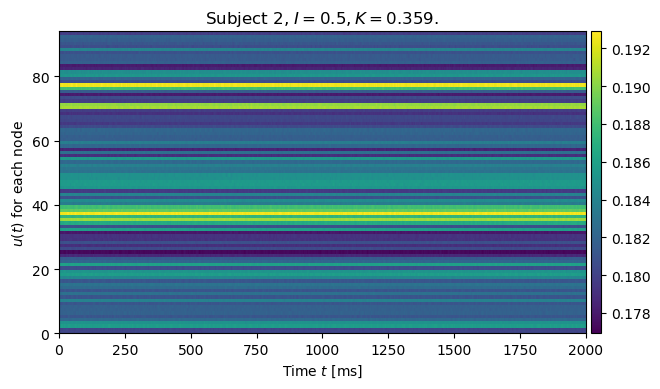

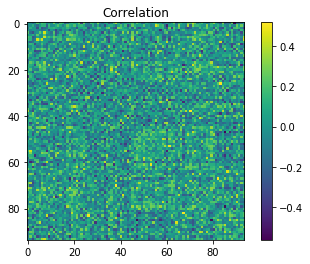










2it [07:48, 234.95s/it]

Subject 3: 1e-1 Accuracy found! 0.4
Subject 3: 1e-2 Accuracy found! 0.3500000000000001
Subject 3: 1e-3 Accuracy found! 0.3490000000000001
Subject 3: 1e-1 Accuracy found! 0.7
Subject 3: 1e-2 Accuracy found! 0.67
Subject 3: 1e-3 Accuracy found! 0.661
Subject 3: 1e-1 Accuracy found! 0.6
Subject 3: 1e-2 Accuracy found! 0.5900000000000001
Subject 3: 1e-3 Accuracy found! 0.5890000000000001


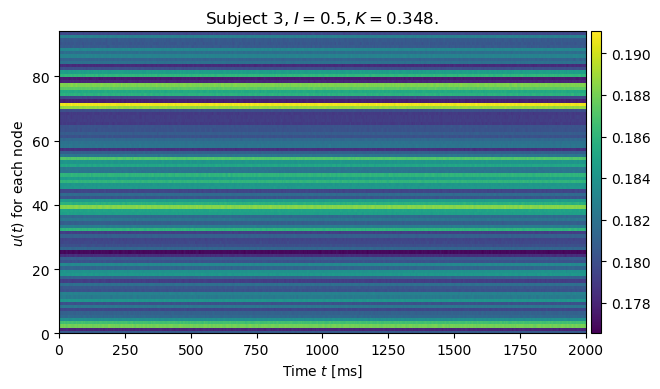

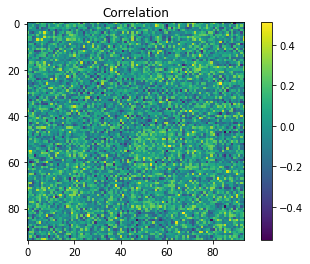










3it [11:39, 233.56s/it]

Subject 4: 1e-1 Accuracy found! 0.30000000000000004
Subject 4: 1e-2 Accuracy found! 0.2900000000000001
Subject 4: 1e-3 Accuracy found! 0.2880000000000001
Subject 4: 1e-1 Accuracy found! 0.6
Subject 4: 1e-2 Accuracy found! 0.5700000000000001
Subject 4: 1e-3 Accuracy found! 0.5660000000000001
Subject 4: 1e-1 Accuracy found! 0.6
Subject 4: 1e-2 Accuracy found! 0.54
Subject 4: 1e-3 Accuracy found! 0.54


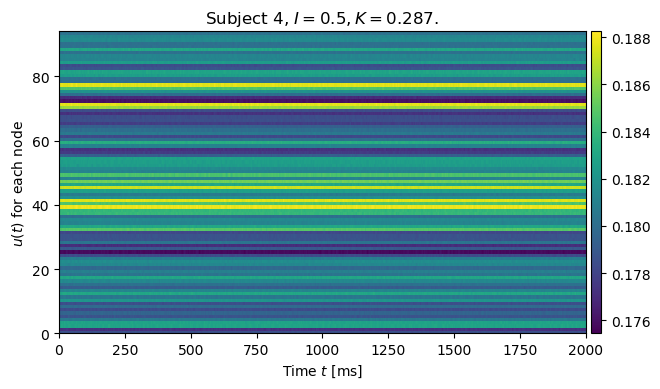

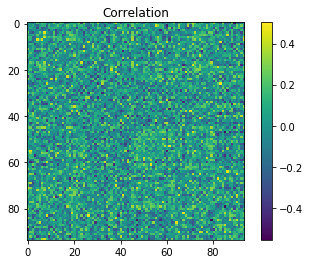










4it [15:44, 237.03s/it]

Subject 5: 1e-1 Accuracy found! 0.4
Subject 5: 1e-2 Accuracy found! 0.3500000000000001
Subject 5: 1e-3 Accuracy found! 0.3490000000000001
Subject 5: 1e-1 Accuracy found! 0.7999999999999999
Subject 5: 1e-2 Accuracy found! 0.78
Subject 5: 1e-3 Accuracy found! 0.78
Subject 5: 1e-1 Accuracy found! 0.7999999999999999
Subject 5: 1e-2 Accuracy found! 0.71
Subject 5: 1e-3 Accuracy found! 0.708


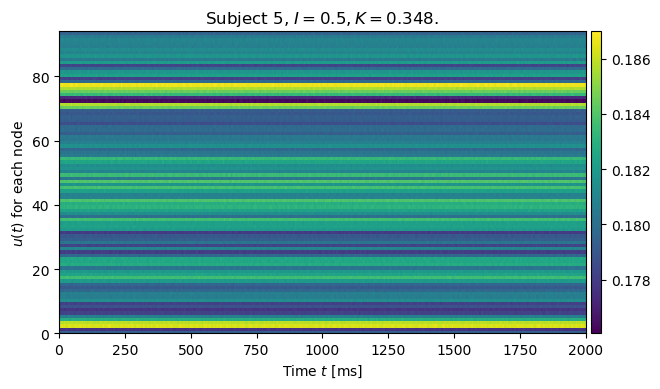

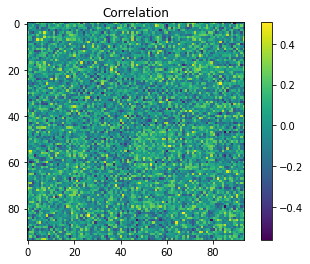










5it [19:46, 238.64s/it]

Subject 6: 1e-1 Accuracy found! 0.4
Subject 6: 1e-2 Accuracy found! 0.31000000000000005
Subject 6: 1e-3 Accuracy found! 0.30400000000000005
Subject 6: 1e-1 Accuracy found! 0.7
Subject 6: 1e-2 Accuracy found! 0.65
Subject 6: 1e-3 Accuracy found! 0.641
Subject 6: 1e-1 Accuracy found! 0.7
Subject 6: 1e-2 Accuracy found! 0.64
Subject 6: 1e-3 Accuracy found! 0.637


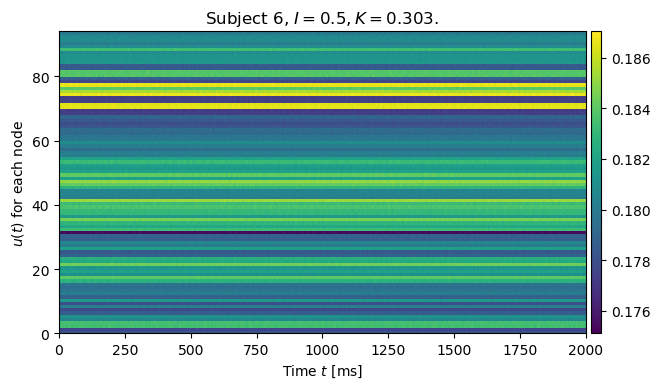

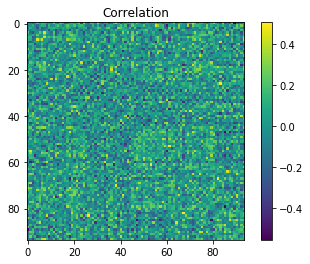










6it [22:25, 214.81s/it]

Subject 7: 1e-1 Accuracy found! 0.4
Subject 7: 1e-2 Accuracy found! 0.3600000000000001
Subject 7: 1e-3 Accuracy found! 0.3590000000000001
Subject 7: 1e-1 Accuracy found! 0.7
Subject 7: 1e-2 Accuracy found! 0.68
Subject 7: 1e-3 Accuracy found! 0.674
Subject 7: 1e-1 Accuracy found! 0.6
Subject 7: 1e-2 Accuracy found! 0.5900000000000001
Subject 7: 1e-3 Accuracy found! 0.5900000000000001


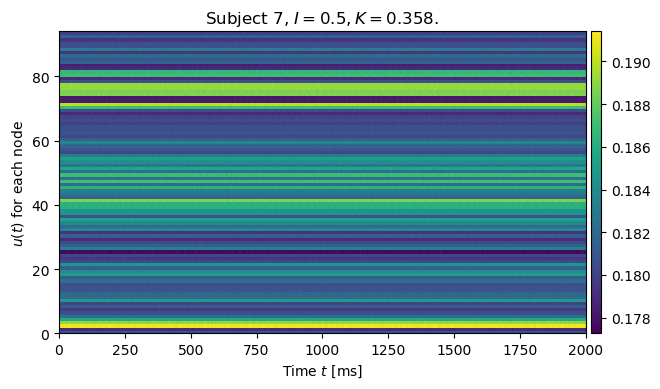

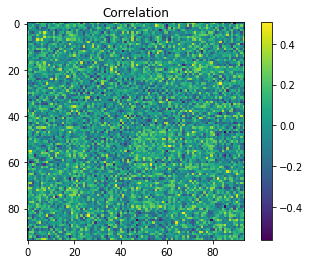










7it [26:47, 228.98s/it]

Subject 8: 1e-1 Accuracy found! 0.4
Subject 8: 1e-2 Accuracy found! 0.3600000000000001
Subject 8: 1e-3 Accuracy found! 0.3540000000000001
Subject 8: 1e-1 Accuracy found! 0.7
Subject 8: 1e-2 Accuracy found! 0.7000000000000001
Subject 8: 1e-3 Accuracy found! 0.6970000000000001
Subject 8: 1e-1 Accuracy found! 0.7
Subject 8: 1e-2 Accuracy found! 0.63
Subject 8: 1e-3 Accuracy found! 0.627


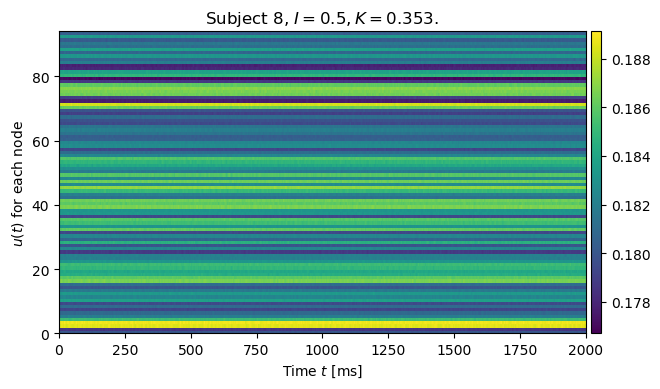

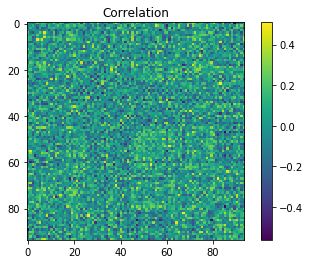










8it [30:21, 224.45s/it]

Subject 9: 1e-1 Accuracy found! 0.4
Subject 9: 1e-2 Accuracy found! 0.3400000000000001
Subject 9: 1e-3 Accuracy found! 0.3350000000000001
Subject 9: 1e-1 Accuracy found! 0.7
Subject 9: 1e-2 Accuracy found! 0.7000000000000001
Subject 9: 1e-3 Accuracy found! 0.6950000000000001
Subject 9: 1e-1 Accuracy found! 0.7
Subject 9: 1e-2 Accuracy found! 0.63
Subject 9: 1e-3 Accuracy found! 0.629


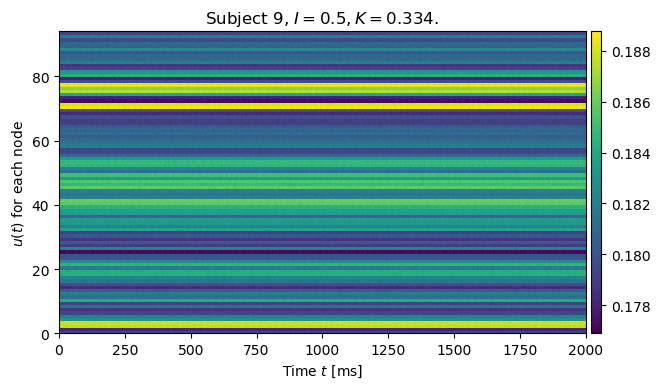

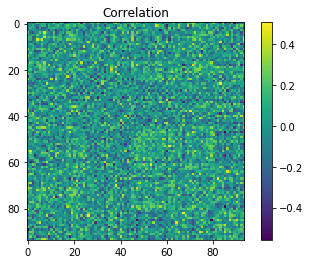










9it [33:59, 222.46s/it]

Subject 10: 1e-1 Accuracy found! 0.4
Subject 10: 1e-2 Accuracy found! 0.3500000000000001
Subject 10: 1e-3 Accuracy found! 0.3420000000000001
Subject 10: 1e-1 Accuracy found! 0.6
Subject 10: 1e-2 Accuracy found! 0.6000000000000001
Subject 10: 1e-3 Accuracy found! 0.5930000000000001
Subject 10: 1e-1 Accuracy found! 0.6
Subject 10: 1e-2 Accuracy found! 0.53
Subject 10: 1e-3 Accuracy found! 0.528


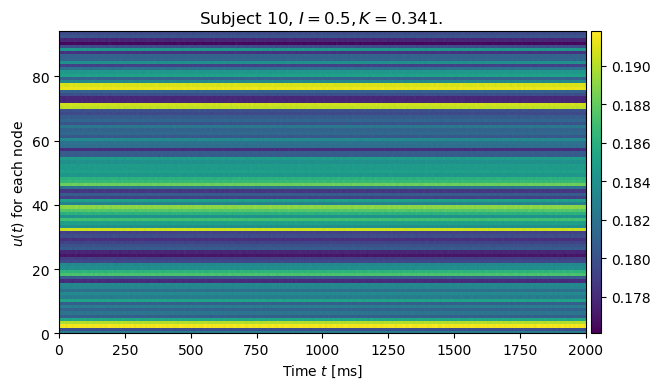

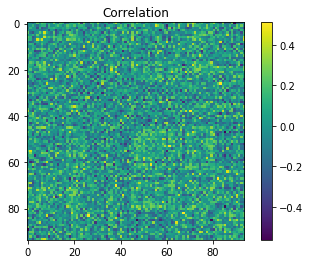










10it [37:05, 211.55s/it]

Subject 11: 1e-1 Accuracy found! 0.4
Subject 11: 1e-2 Accuracy found! 0.32000000000000006
Subject 11: 1e-3 Accuracy found! 0.31700000000000006
Subject 11: 1e-1 Accuracy found! 0.6
Subject 11: 1e-2 Accuracy found! 0.56
Subject 11: 1e-3 Accuracy found! 0.559
Subject 11: 1e-1 Accuracy found! 0.6
Subject 11: 1e-2 Accuracy found! 0.51
Subject 11: 1e-3 Accuracy found! 0.507


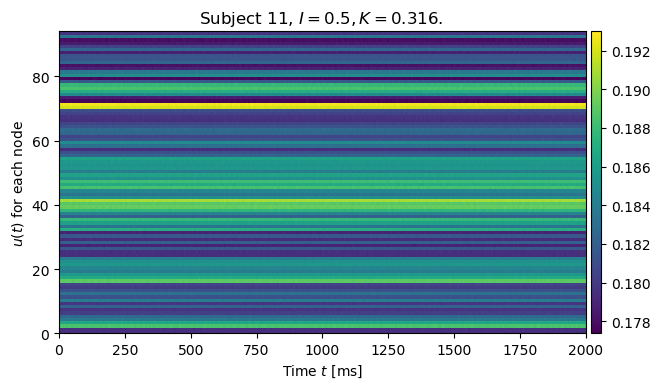

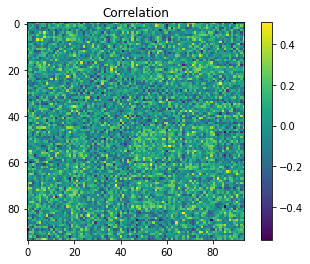










11it [40:13, 204.51s/it]

Subject 12: 1e-1 Accuracy found! 0.4
Subject 12: 1e-2 Accuracy found! 0.3600000000000001
Subject 12: 1e-3 Accuracy found! 0.3530000000000001
Subject 12: 1e-1 Accuracy found! 0.6
Subject 12: 1e-2 Accuracy found! 0.54
Subject 12: 1e-3 Accuracy found! 0.531
Subject 12: 1e-1 Accuracy found! 0.5
Subject 12: 1e-2 Accuracy found! 0.5000000000000001
Subject 12: 1e-3 Accuracy found! 0.4960000000000001


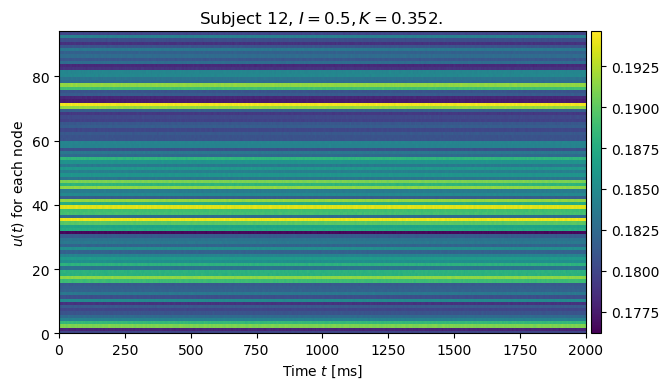

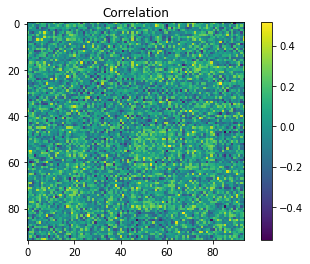










12it [43:09, 196.04s/it]










In [160]:
try:
    transitionK_I05 = np.load('transitionK_allSCs_I05_sig00001_thres0001_s42-1-2.npy')
    print('loaded data.')
except:
    print('recompute data...')    
    par = load_parameters(); parTest = load_parameters()
    par['sigma'] = 0.0001; parTest['sigma'] = 0.0001
    #for i in Is:
    par['I'] = 0.5; parTest['I'] = 0.5
    KsI05 = []
    KsI05_seed1 = []
    KsI05_seed2 = []
    for i, SC in tqdm_notebook(enumerate(SCs)):
        par['SC'] = SC; parTest['SC'] = SC
        par['K'] = 0.
        K_I05 = find_k_transition(par,i+1,thres=0.001)
        K_I05_seed1 = find_k_transition(par,i+1,thres=0.001,rs=1)
        K_I05_seed2 = find_k_transition(par,i+1,thres=0.001,rs=2)
        parTest['K'] = K_I05
        _,xs,_,_,_,_ = timeIntegrationRK4(parTest, randomseed=42)
        plotSpikeTrain_ini(xs[:,10000:], parTest, 'Subject {}, '.format(i+1))
        plot_PC(xs)
        KsI05.append(K_I05)
        KsI05_seed1.append(K_I05_seed1)
        KsI05_seed2.append(K_I05_seed2)
        
    transitionK_I05 = [KsI05, KsI05_seed1, KsI05_seed2]
    np.save('transitionK_allSCs_I05_sig00001_thres0001_s42-1-2.npy', transitionK_I05)

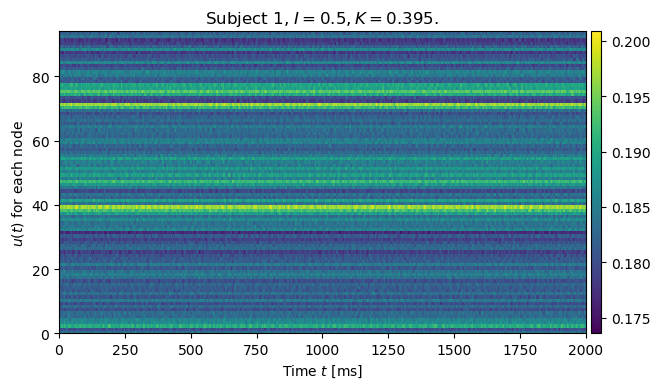

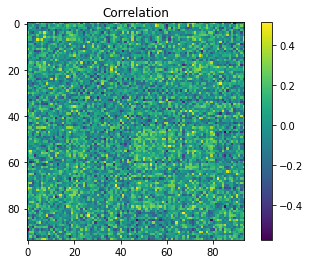

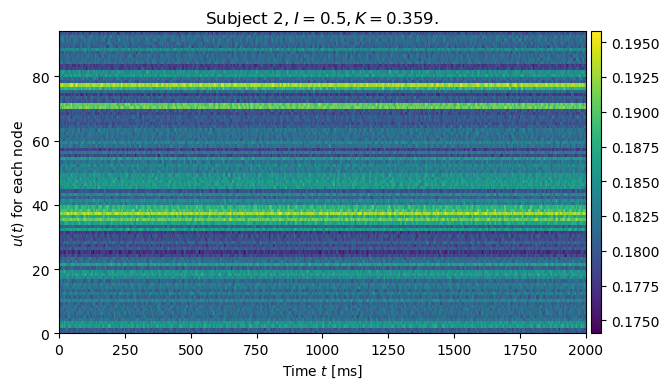

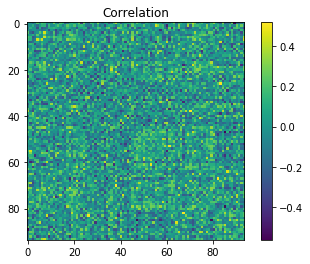

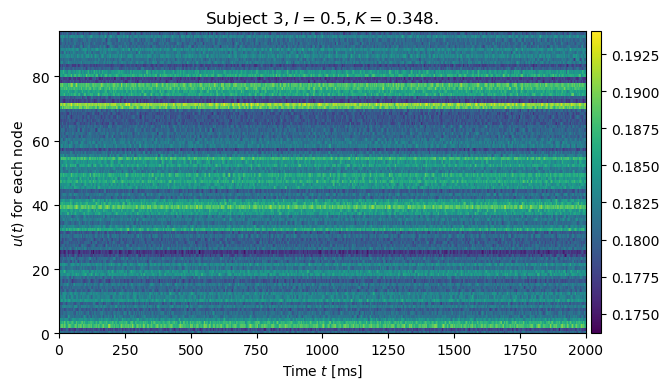

...

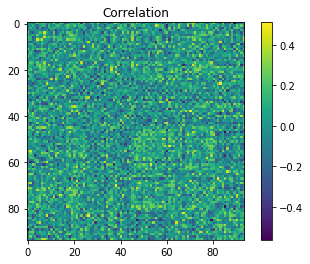

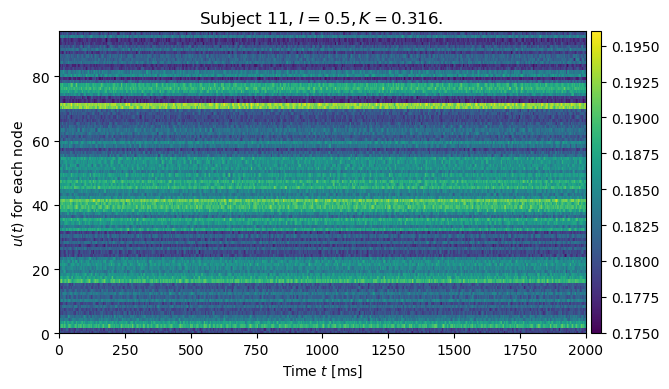

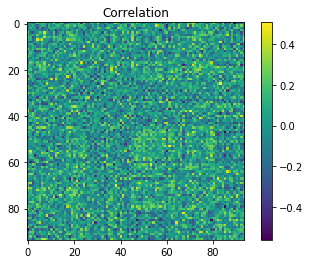

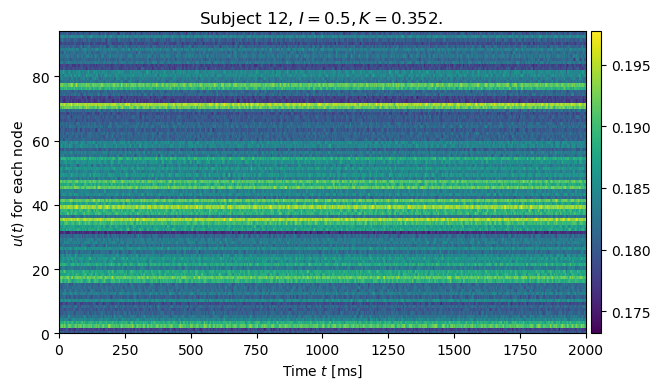

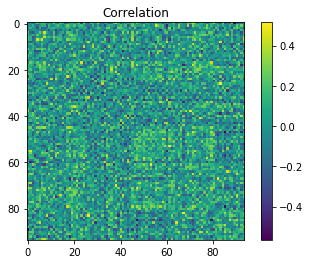

In [167]:
parTest = load_parameters()
parTest['I'] = 0.5
parTest['sigma'] = 0.001

for i, SC in enumerate(SCs):
    parTest['SC'] = SC
    parTest['K'] = transitionK_I05[0][i]
    _,xs,_,_,_,_ = timeIntegrationRK4(parTest, randomseed=42)
    plotSpikeTrain_ini(xs[:,10000:], parTest, 'Subject {}, '.format(i+1))
    plot_PC(xs)


Text(0.5,1,'Transistions for $I_{ext}=0.5$')

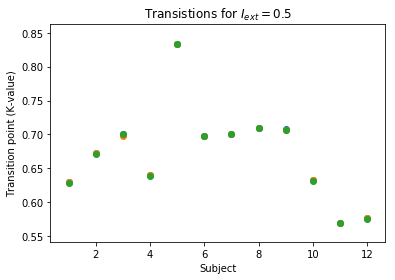

In [105]:
plt.scatter([x+1 for x in range(12)], KsI05)
plt.scatter([x+1 for x in range(12)], KsI05_seed1)
plt.scatter([x+1 for x in range(12)], KsI05_seed2)
plt.xlabel('Subject')
plt.ylabel('Transition point (K-value)')
plt.title(r'Transistions for $I_{ext}=0.5$')

Subject 1: 1e-1 Accuracy found! 0.7
Subject 1: 1e-2 Accuracy found! 0.63
Subject 1: 1e-3 Accuracy found! 0.629
Subject 1: 1e-1 Accuracy found! 0.7
Subject 1: 1e-2 Accuracy found! 0.63
Subject 1: 1e-3 Accuracy found! 0.625


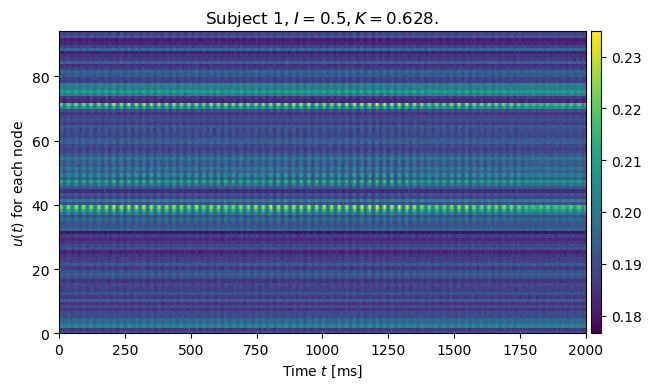

Subject 2: 1e-1 Accuracy found! 0.7
Subject 2: 1e-2 Accuracy found! 0.68
Subject 2: 1e-3 Accuracy found! 0.671
Subject 2: 1e-1 Accuracy found! 0.7
Subject 2: 1e-2 Accuracy found! 0.67
Subject 2: 1e-3 Accuracy found! 0.669


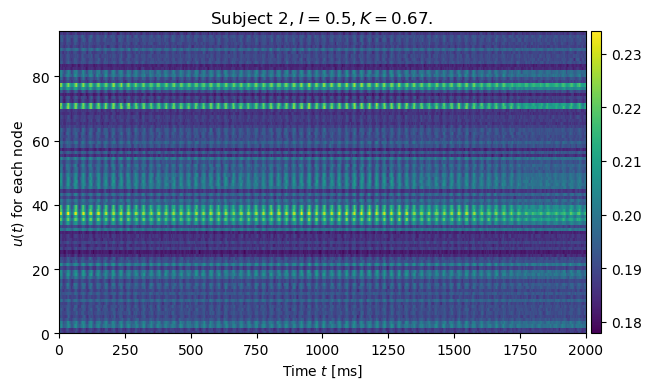

Subject 3: 1e-1 Accuracy found! 0.7
Subject 3: 1e-2 Accuracy found! 0.7000000000000001
Subject 3: 1e-3 Accuracy found! 0.6990000000000001
Subject 3: 1e-1 Accuracy found! 0.7
Subject 3: 1e-2 Accuracy found! 0.7000000000000001
Subject 3: 1e-3 Accuracy found! 0.6950000000000001


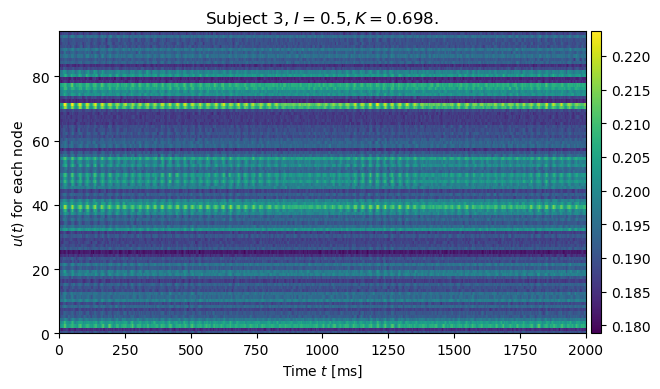

Subject 4: 1e-1 Accuracy found! 0.7
Subject 4: 1e-2 Accuracy found! 0.64
Subject 4: 1e-3 Accuracy found! 0.637
Subject 4: 1e-1 Accuracy found! 0.7
Subject 4: 1e-2 Accuracy found! 0.64
Subject 4: 1e-3 Accuracy found! 0.636


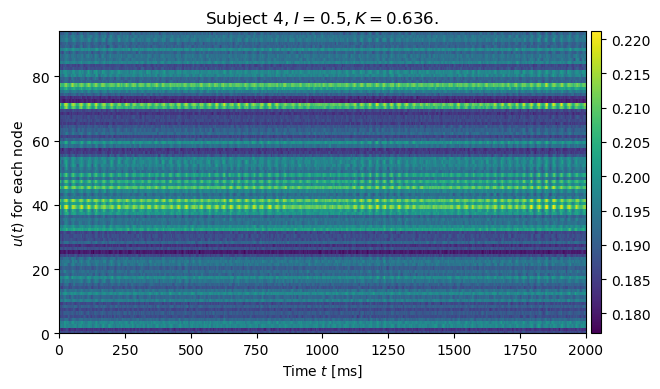

Subject 5: 1e-1 Accuracy found! 0.8999999999999999
Subject 5: 1e-2 Accuracy found! 0.84
Subject 5: 1e-3 Accuracy found! 0.831
Subject 5: 1e-1 Accuracy found! 0.8999999999999999
Subject 5: 1e-2 Accuracy found! 0.83
Subject 5: 1e-3 Accuracy found! 0.829


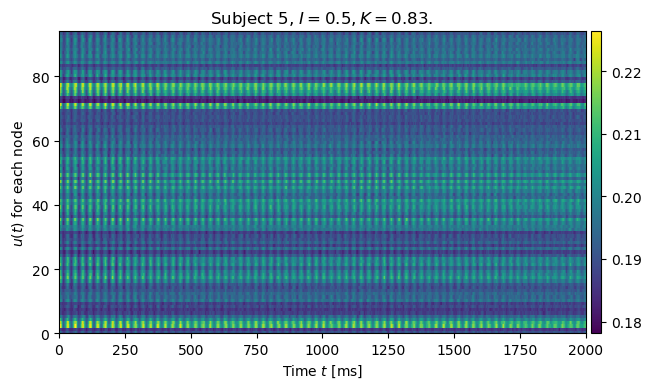

Subject 6: 1e-1 Accuracy found! 0.7
Subject 6: 1e-2 Accuracy found! 0.7000000000000001
Subject 6: 1e-3 Accuracy found! 0.6960000000000001
Subject 6: 1e-1 Accuracy found! 0.7
Subject 6: 1e-2 Accuracy found! 0.7000000000000001
Subject 6: 1e-3 Accuracy found! 0.6950000000000001


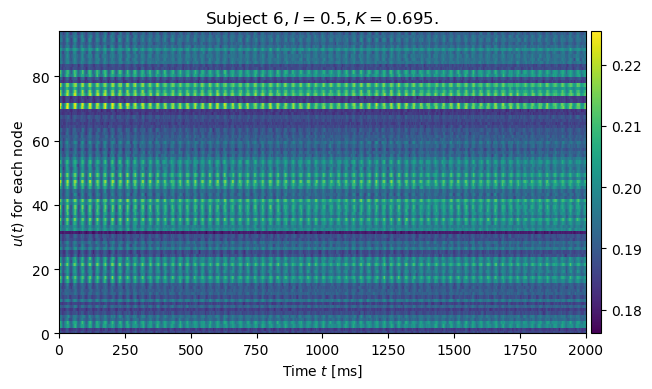

Subject 7: 1e-1 Accuracy found! 0.7
Subject 7: 1e-2 Accuracy found! 0.7000000000000001
Subject 7: 1e-3 Accuracy found! 0.6990000000000001
Subject 7: 1e-1 Accuracy found! 0.7
Subject 7: 1e-2 Accuracy found! 0.7000000000000001
Subject 7: 1e-3 Accuracy found! 0.6960000000000001


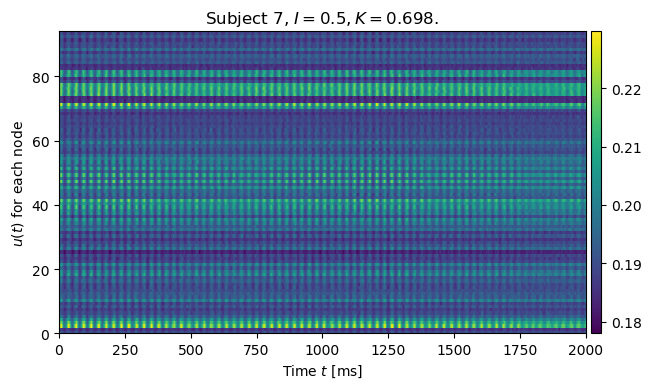

Subject 8: 1e-1 Accuracy found! 0.7999999999999999
Subject 8: 1e-2 Accuracy found! 0.71
Subject 8: 1e-3 Accuracy found! 0.708
Subject 8: 1e-1 Accuracy found! 0.7999999999999999
Subject 8: 1e-2 Accuracy found! 0.71
Subject 8: 1e-3 Accuracy found! 0.707


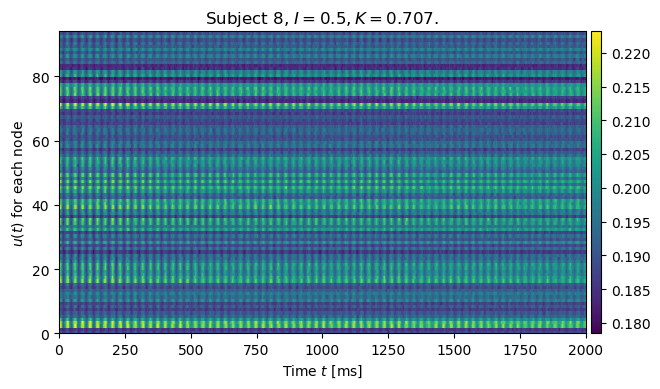

Subject 9: 1e-1 Accuracy found! 0.7999999999999999
Subject 9: 1e-2 Accuracy found! 0.71
Subject 9: 1e-3 Accuracy found! 0.705
Subject 9: 1e-1 Accuracy found! 0.7999999999999999
Subject 9: 1e-2 Accuracy found! 0.71
Subject 9: 1e-3 Accuracy found! 0.704


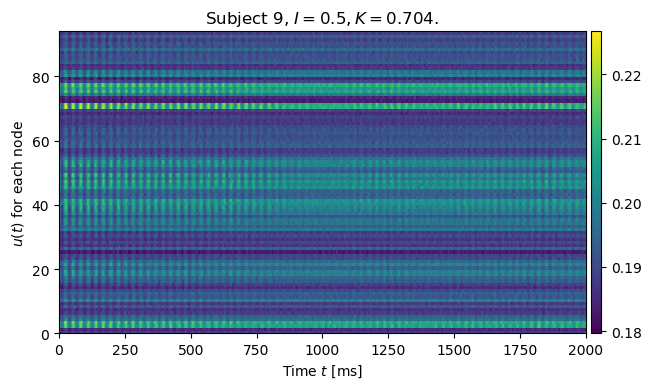

Subject 10: 1e-1 Accuracy found! 0.7
Subject 10: 1e-2 Accuracy found! 0.64
Subject 10: 1e-3 Accuracy found! 0.631
Subject 10: 1e-1 Accuracy found! 0.7
Subject 10: 1e-2 Accuracy found! 0.63
Subject 10: 1e-3 Accuracy found! 0.629


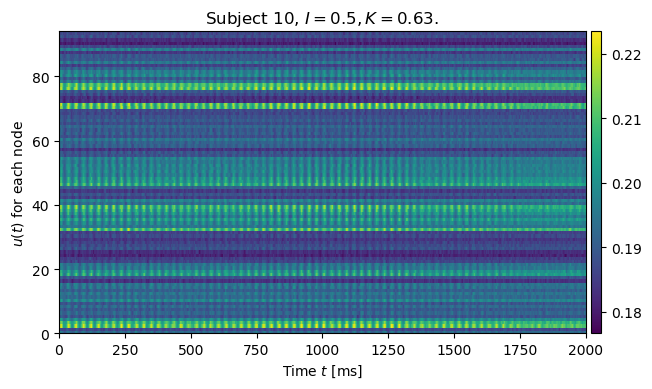

Subject 11: 1e-1 Accuracy found! 0.6
Subject 11: 1e-2 Accuracy found! 0.5700000000000001
Subject 11: 1e-3 Accuracy found! 0.5680000000000001
Subject 11: 1e-1 Accuracy found! 0.6
Subject 11: 1e-2 Accuracy found! 0.5700000000000001
Subject 11: 1e-3 Accuracy found! 0.5670000000000001


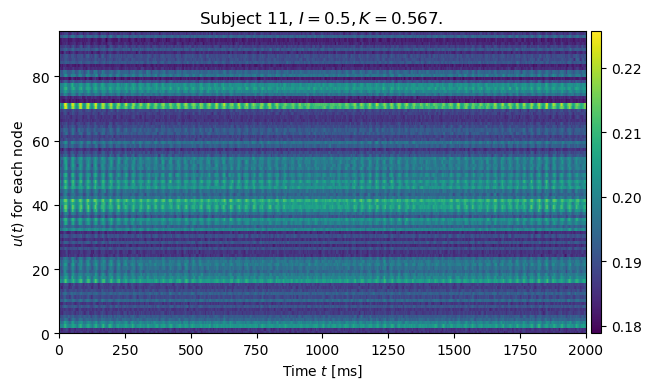

Subject 12: 1e-1 Accuracy found! 0.6
Subject 12: 1e-2 Accuracy found! 0.5800000000000001
Subject 12: 1e-3 Accuracy found! 0.5750000000000001
Subject 12: 1e-1 Accuracy found! 0.6
Subject 12: 1e-2 Accuracy found! 0.5800000000000001
Subject 12: 1e-3 Accuracy found! 0.5730000000000001


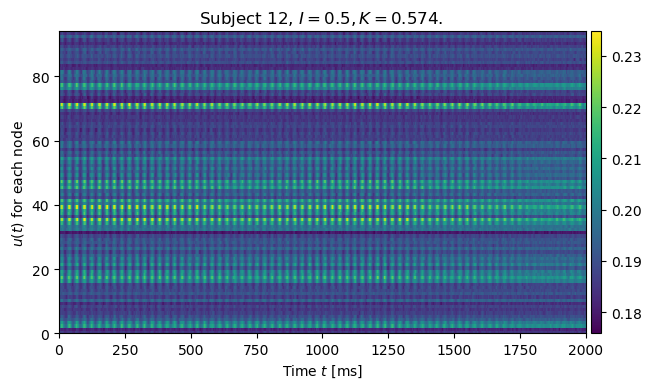

In [117]:
par = load_parameters()
par['sigma'] = 0.001
#for i in Is:
par['I'] = 0.5
KsI05 = []
KsI05_seed1 = []
for i, SC in enumerate(SCs):
    par['SC'] = SC
    par['K'] = 0.
    K_I05 = find_k_transition(par,i+1,0.02)
    K_I05_seed1 = find_k_transition(par,i+1,0.02,rs=1)
    par['K'] = K_I05
    _,xs,_,_,_,_ = timeIntegrationRK4(par, randomseed=42)
    plotSpikeTrain_ini(xs[:,10000:], par, 'Subject {}, '.format(i+1))
    KsI05.append(K_I05)
    KsI05_seed1.append(K_I05_seed1)


Text(0.5, 1.0, 'Transistions for $I_{ext}=0.5$')

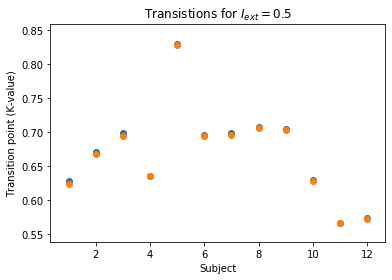

In [133]:
plt.scatter([x+1 for x in range(12)], KsI05)
plt.scatter([x+1 for x in range(12)], KsI05_seed1)
plt.xlabel('Subject')
plt.ylabel('Transition point (K-value)')
plt.title(r'Transistions for $I_{ext}=0.5$')

Use same threshold as with $I_{ext}=0.7$ 

Subject 1: 1e-1 Accuracy found! 0.4
Subject 1: 1e-2 Accuracy found! 0.33000000000000007
Subject 1: 1e-3 Accuracy found! 0.32100000000000006
Subject 1: 1e-1 Accuracy found! 0.4
Subject 1: 1e-2 Accuracy found! 0.33000000000000007
Subject 1: 1e-3 Accuracy found! 0.32100000000000006
Subject 1: 1e-1 Accuracy found! 0.4
Subject 1: 1e-2 Accuracy found! 0.33000000000000007
Subject 1: 1e-3 Accuracy found! 0.32100000000000006


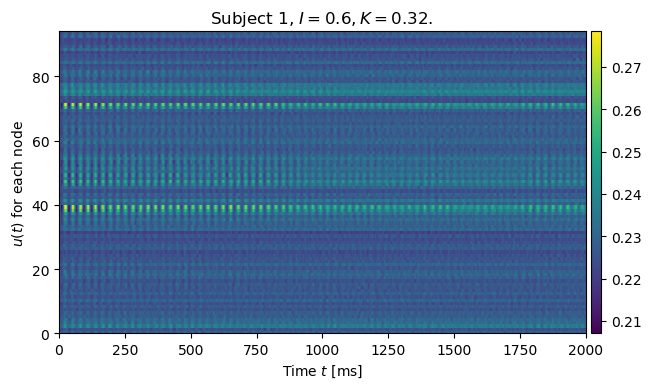

Subject 2: 1e-1 Accuracy found! 0.4
Subject 2: 1e-2 Accuracy found! 0.3500000000000001
Subject 2: 1e-3 Accuracy found! 0.3430000000000001
Subject 2: 1e-1 Accuracy found! 0.4
Subject 2: 1e-2 Accuracy found! 0.3500000000000001
Subject 2: 1e-3 Accuracy found! 0.3420000000000001
Subject 2: 1e-1 Accuracy found! 0.4
Subject 2: 1e-2 Accuracy found! 0.3500000000000001
Subject 2: 1e-3 Accuracy found! 0.3420000000000001


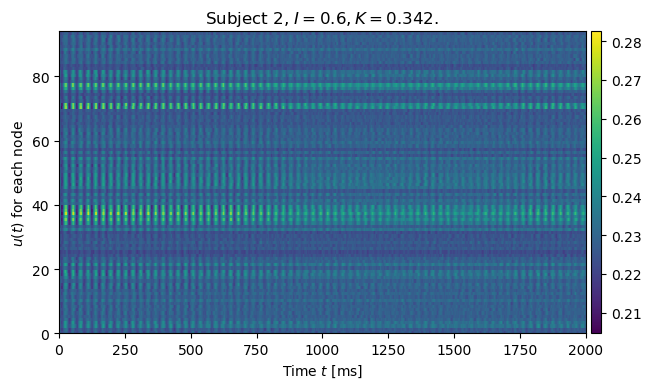

Subject 3: 1e-1 Accuracy found! 0.4
Subject 3: 1e-2 Accuracy found! 0.3600000000000001
Subject 3: 1e-3 Accuracy found! 0.3570000000000001
Subject 3: 1e-1 Accuracy found! 0.4
Subject 3: 1e-2 Accuracy found! 0.3600000000000001
Subject 3: 1e-3 Accuracy found! 0.3570000000000001
Subject 3: 1e-1 Accuracy found! 0.4
Subject 3: 1e-2 Accuracy found! 0.3600000000000001
Subject 3: 1e-3 Accuracy found! 0.3560000000000001


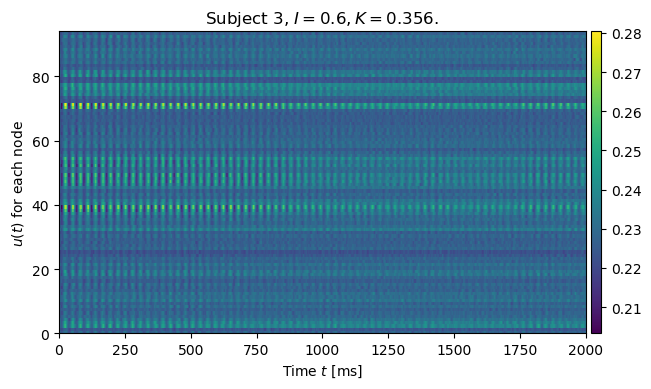

Subject 4: 1e-1 Accuracy found! 0.4
Subject 4: 1e-2 Accuracy found! 0.33000000000000007
Subject 4: 1e-3 Accuracy found! 0.32600000000000007
Subject 4: 1e-1 Accuracy found! 0.4
Subject 4: 1e-2 Accuracy found! 0.33000000000000007
Subject 4: 1e-3 Accuracy found! 0.32600000000000007
Subject 4: 1e-1 Accuracy found! 0.4
Subject 4: 1e-2 Accuracy found! 0.33000000000000007
Subject 4: 1e-3 Accuracy found! 0.32600000000000007


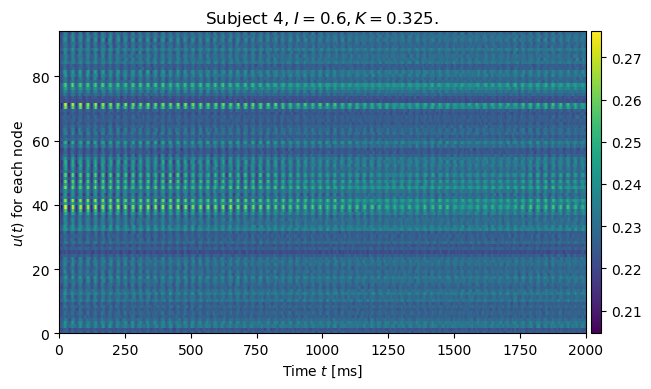

Subject 5: 1e-1 Accuracy found! 0.5
Subject 5: 1e-2 Accuracy found! 0.43000000000000005
Subject 5: 1e-3 Accuracy found! 0.42600000000000005
Subject 5: 1e-1 Accuracy found! 0.5
Subject 5: 1e-2 Accuracy found! 0.43000000000000005
Subject 5: 1e-3 Accuracy found! 0.42600000000000005
Subject 5: 1e-1 Accuracy found! 0.5
Subject 5: 1e-2 Accuracy found! 0.43000000000000005
Subject 5: 1e-3 Accuracy found! 0.42500000000000004


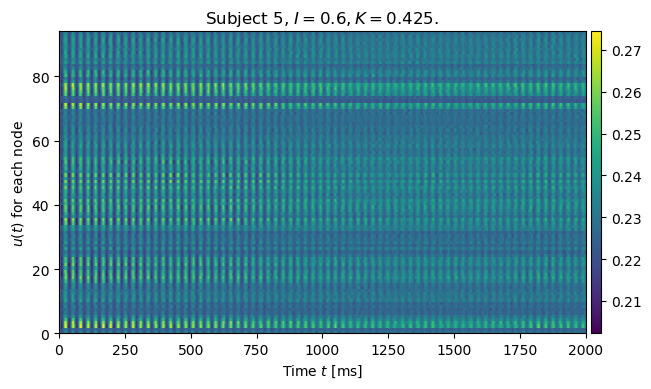

Subject 6: 1e-1 Accuracy found! 0.4
Subject 6: 1e-2 Accuracy found! 0.3600000000000001
Subject 6: 1e-3 Accuracy found! 0.3560000000000001
Subject 6: 1e-1 Accuracy found! 0.4
Subject 6: 1e-2 Accuracy found! 0.3600000000000001
Subject 6: 1e-3 Accuracy found! 0.3560000000000001
Subject 6: 1e-1 Accuracy found! 0.4
Subject 6: 1e-2 Accuracy found! 0.3600000000000001
Subject 6: 1e-3 Accuracy found! 0.3560000000000001


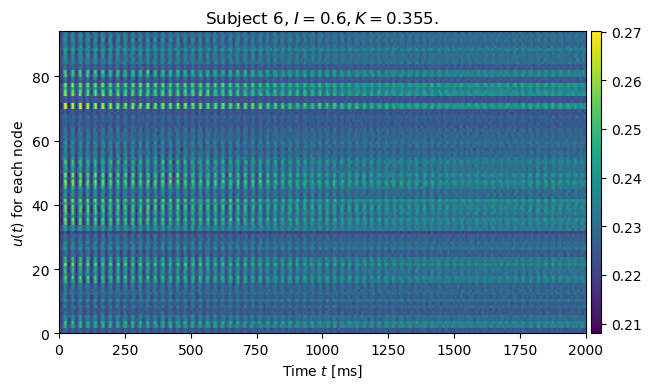

Subject 7: 1e-1 Accuracy found! 0.4
Subject 7: 1e-2 Accuracy found! 0.3600000000000001
Subject 7: 1e-3 Accuracy found! 0.3580000000000001
Subject 7: 1e-1 Accuracy found! 0.4
Subject 7: 1e-2 Accuracy found! 0.3600000000000001
Subject 7: 1e-3 Accuracy found! 0.3570000000000001
Subject 7: 1e-1 Accuracy found! 0.4
Subject 7: 1e-2 Accuracy found! 0.3600000000000001
Subject 7: 1e-3 Accuracy found! 0.3570000000000001


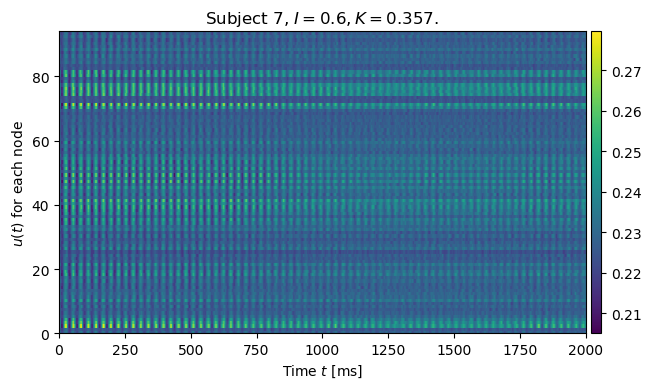

Subject 8: 1e-1 Accuracy found! 0.4
Subject 8: 1e-2 Accuracy found! 0.3700000000000001
Subject 8: 1e-3 Accuracy found! 0.3630000000000001
Subject 8: 1e-1 Accuracy found! 0.4
Subject 8: 1e-2 Accuracy found! 0.3700000000000001
Subject 8: 1e-3 Accuracy found! 0.3630000000000001
Subject 8: 1e-1 Accuracy found! 0.4
Subject 8: 1e-2 Accuracy found! 0.3700000000000001
Subject 8: 1e-3 Accuracy found! 0.3620000000000001


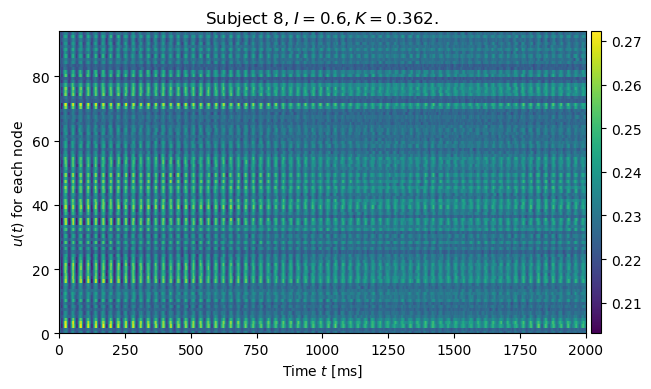

Subject 9: 1e-1 Accuracy found! 0.4
Subject 9: 1e-2 Accuracy found! 0.3700000000000001
Subject 9: 1e-3 Accuracy found! 0.3610000000000001
Subject 9: 1e-1 Accuracy found! 0.4
Subject 9: 1e-2 Accuracy found! 0.3700000000000001
Subject 9: 1e-3 Accuracy found! 0.3610000000000001
Subject 9: 1e-1 Accuracy found! 0.4
Subject 9: 1e-2 Accuracy found! 0.3700000000000001
Subject 9: 1e-3 Accuracy found! 0.3610000000000001


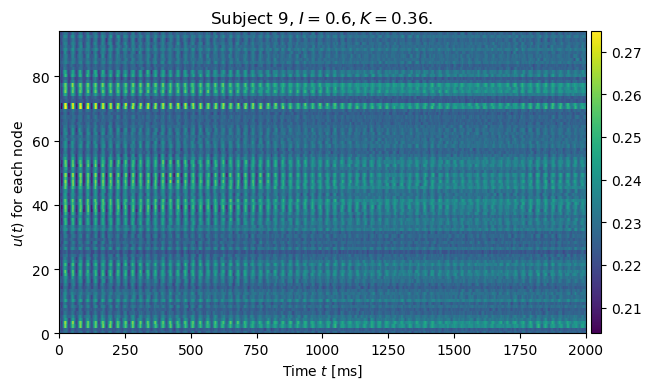

Subject 10: 1e-1 Accuracy found! 0.4
Subject 10: 1e-2 Accuracy found! 0.33000000000000007
Subject 10: 1e-3 Accuracy found! 0.32300000000000006
Subject 10: 1e-1 Accuracy found! 0.4
Subject 10: 1e-2 Accuracy found! 0.33000000000000007
Subject 10: 1e-3 Accuracy found! 0.32300000000000006
Subject 10: 1e-1 Accuracy found! 0.4
Subject 10: 1e-2 Accuracy found! 0.33000000000000007
Subject 10: 1e-3 Accuracy found! 0.32200000000000006


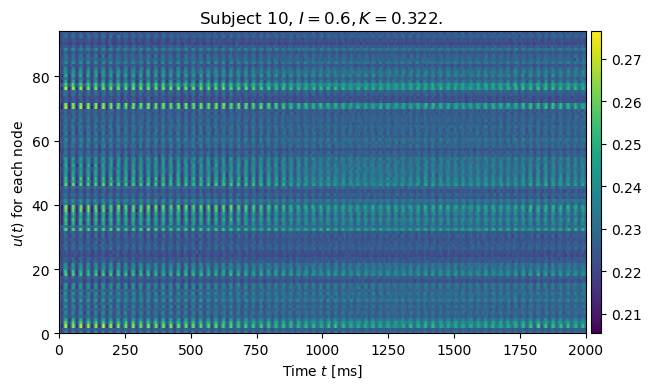

Subject 11: 1e-1 Accuracy found! 0.30000000000000004
Subject 11: 1e-2 Accuracy found! 0.3000000000000001
Subject 11: 1e-3 Accuracy found! 0.2910000000000001
Subject 11: 1e-1 Accuracy found! 0.30000000000000004
Subject 11: 1e-2 Accuracy found! 0.3000000000000001
Subject 11: 1e-3 Accuracy found! 0.2910000000000001
Subject 11: 1e-1 Accuracy found! 0.30000000000000004
Subject 11: 1e-2 Accuracy found! 0.3000000000000001
Subject 11: 1e-3 Accuracy found! 0.2910000000000001


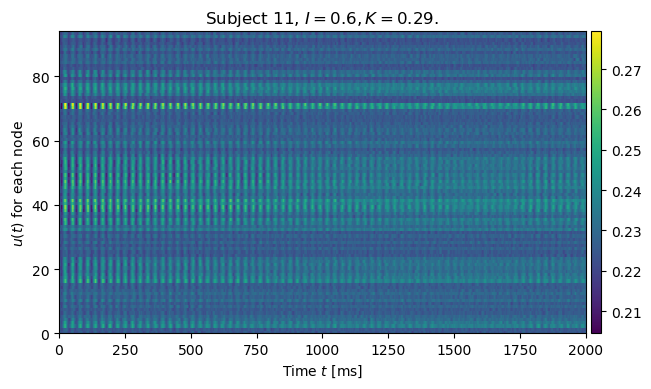

Subject 12: 1e-1 Accuracy found! 0.30000000000000004
Subject 12: 1e-2 Accuracy found! 0.3000000000000001
Subject 12: 1e-3 Accuracy found! 0.2940000000000001
Subject 12: 1e-1 Accuracy found! 0.30000000000000004
Subject 12: 1e-2 Accuracy found! 0.3000000000000001
Subject 12: 1e-3 Accuracy found! 0.2940000000000001
Subject 12: 1e-1 Accuracy found! 0.30000000000000004
Subject 12: 1e-2 Accuracy found! 0.3000000000000001
Subject 12: 1e-3 Accuracy found! 0.2930000000000001


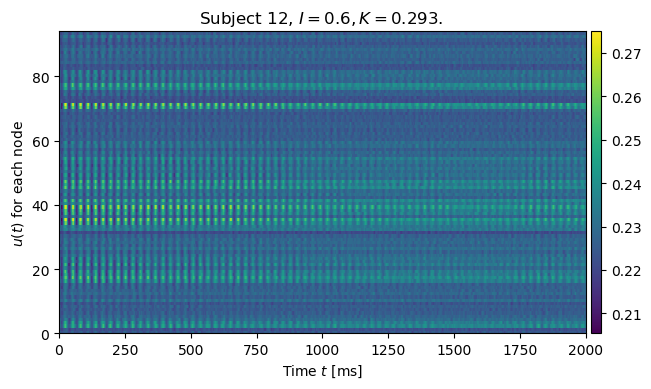

In [144]:
par = load_parameters()
par['sigma'] = 0.001
par['I'] = 0.6
KsI06 = []
KsI06_seed1 = []
KsI06_seed2 = []
for i, SC in enumerate(SCs):
    par['SC'] = SC
    par['K'] = 0.
    K_I06 = find_k_transition(par,i+1, thres=0.04)
    K_I06_seed1 = find_k_transition(par,i+1,rs=1, thres=0.04)
    K_I06_seed2 = find_k_transition(par,i+1,rs=2, thres=0.04)
    par['K'] = K_I06
    _,xs,_,_,_,_ = timeIntegrationRK4(par, randomseed=42)
    plotSpikeTrain_ini(xs[:,10000:], par, 'Subject {}, '.format(i+1))
    KsI06.append(K_I06)
    KsI06_seed1.append(K_I06_seed1)
    KsI06_seed2.append(K_I06_seed2)


Text(0.5, 1.0, 'Transistions for $I_{ext}=0.6$')

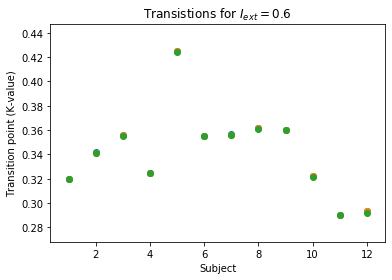

In [145]:
plt.scatter([x+1 for x in range(12)], KsI06)
plt.scatter([x+1 for x in range(12)], KsI06_seed1)
plt.scatter([x+1 for x in range(12)], KsI06_seed2)
plt.xlabel('Subject')
plt.ylabel('Transition point (K-value)')
plt.title(r'Transistions for $I_{ext}=0.6$')

recompute data...
Subject 1: 1e-1 Accuracy found! 0.1
Subject 1: 1e-2 Accuracy found! 0.060000000000000005
Subject 1: 1e-3 Accuracy found! 0.06000000000000001
Subject 1: 1e-1 Accuracy found! 0.1
Subject 1: 1e-2 Accuracy found! 0.060000000000000005
Subject 1: 1e-3 Accuracy found! 0.06000000000000001
Subject 1: 1e-1 Accuracy found! 0.1
Subject 1: 1e-2 Accuracy found! 0.060000000000000005
Subject 1: 1e-3 Accuracy found! 0.06000000000000001


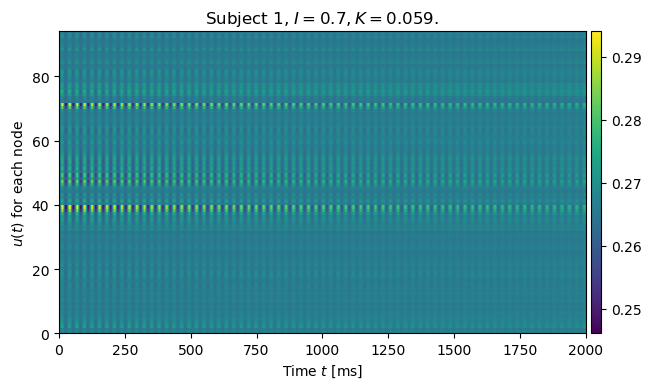

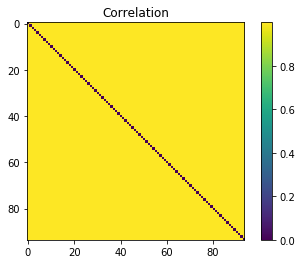

Subject 2: 1e-1 Accuracy found! 0.1


KeyboardInterrupt: 

In [152]:
try:
    transitionK_I07 = np.load('transitionK_allSCs_I07_sig0000001_thres002_s42-1-2.npy')
    print('loaded data.')
except:
    print('recompute data...')    
    par = load_parameters()
    par['sigma'] = 0.000001
    par['I'] = 0.7
    KsI07 = []
    KsI07_seed1 = []
    KsI07_seed2 = []
    for i, SC in enumerate(SCs):
        par['SC'] = SC
        par['K'] = 0.
        K_I07 = find_k_transition(par,i+1, thres=0.02)
        K_I07_seed1 = find_k_transition(par,i+1,rs=1, thres=0.02)
        K_I07_seed2 = find_k_transition(par,i+1,rs=2, thres=0.02)
        par['K'] = K_I07
        _,xs,_,_,_,_ = timeIntegrationRK4(par, randomseed=42)
        plotSpikeTrain_ini(xs[:,10000:], par, 'Subject {}, '.format(i+1))
        plot_PC(xs)
        KsI07.append(K_I07)
        KsI07_seed1.append(K_I07_seed1)
        KsI07_seed2.append(K_I07_seed2)
    transitionK_I07 = [KsI07, KsI07_seed1, KsI07_seed2]
    np.save('transitionK_allSCs_I07_thres002_s42-1-2.npy', transitionK_I07)

Text(0.5, 1.0, 'Transistions for $I_{ext}=0.7$')

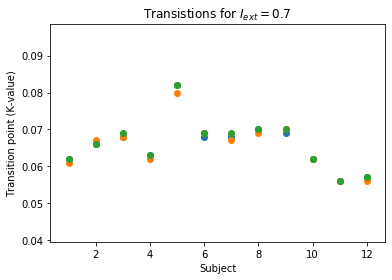

In [143]:
plt.scatter([x+1 for x in range(12)], KsI07)
plt.scatter([x+1 for x in range(12)], KsI07_seed1)
plt.scatter([x+1 for x in range(12)], KsI07_seed2)
plt.xlabel('Subject')
plt.ylabel('Transition point (K-value)')
plt.title(r'Transistions for $I_{ext}=0.7$')

# Stimulate all nodes for different transition points

In [164]:
transitionK_I05 = np.load('transitionK_allSCs_I05_sig00001_thres0001_s42-1-2.npy')
transitionK_I05[0]

array([0.395, 0.359, 0.348, 0.287, 0.348, 0.303, 0.358, 0.353, 0.334,
       0.341, 0.316, 0.352])

 ######### _____ SUBJECT 1 _____ ######### 


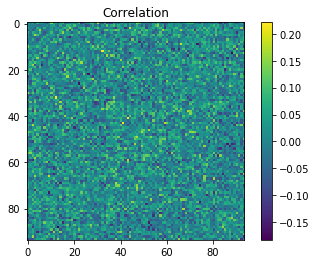

1.4734321124367815 34.817427261240816
 ######### _____ SUBJECT 2 _____ ######### 


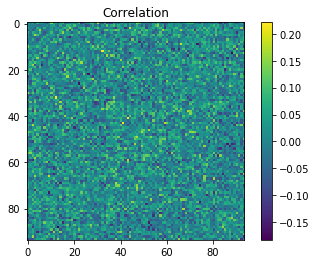

1.4396526981038142 34.416653793656025
 ######### _____ SUBJECT 3 _____ ######### 


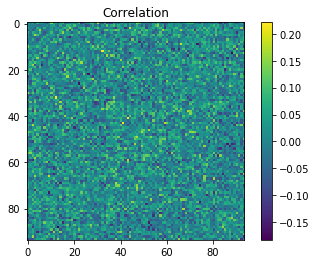

1.4546879098888734 33.73159112351525
 ######### _____ SUBJECT 4 _____ ######### 


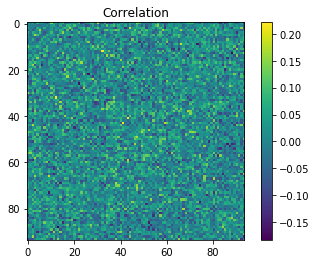

1.568618128180988 36.61123659971191
 ######### _____ SUBJECT 5 _____ ######### 


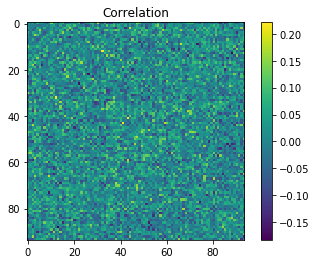

1.352575280665144 30.344773877025382
 ######### _____ SUBJECT 6 _____ ######### 


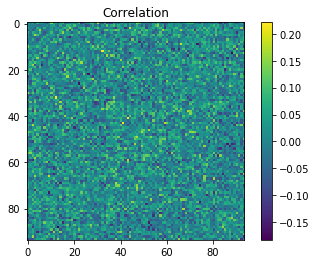

1.480902939052609 34.88442326531779
 ######### _____ SUBJECT 7 _____ ######### 


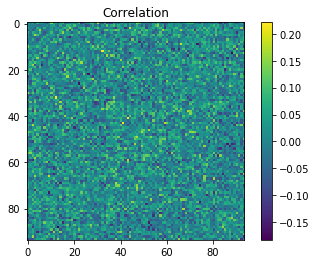

1.4632147057170912 34.36365116156739
 ######### _____ SUBJECT 8 _____ ######### 


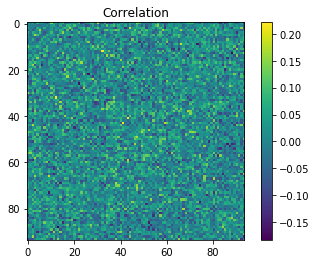

1.4788320656771639 34.9360287540453
 ######### _____ SUBJECT 9 _____ ######### 


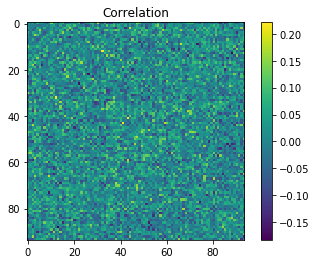

1.4918576580850997 34.30879788347129
 ######### _____ SUBJECT 10 _____ ######### 


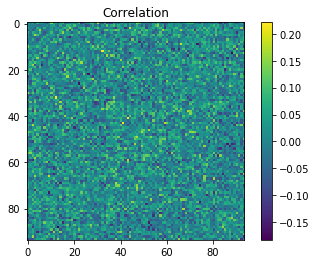

1.4973094073367434 35.99864899065617
 ######### _____ SUBJECT 11 _____ ######### 


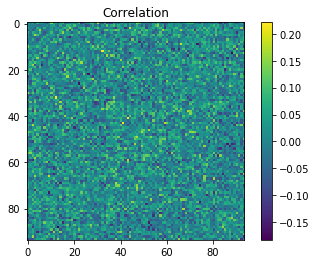

1.7468310823836377 41.02576203771224
 ######### _____ SUBJECT 12 _____ ######### 


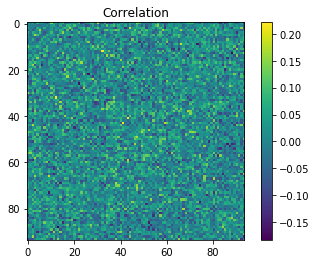

1.714391140086435 39.38571594358864


In [173]:
par = load_parameters()
par['I'] = 0.5
par['sigma'] = 0.001
tstart=20000 # in unit of timesteps dt

functionalEffect_t1 = np.zeros((len(SCs), par['N']))
structuralEffect_t1 = np.zeros((len(SCs), par['N']))
fractionalActivation_t1 = np.zeros((len(SCs), par['N']))

#iterate through all SCs
for i, sc in enumerate(SCs):
    par['K'] = transitionK_I05[0][i]
    par['SC'] = sc
    print(' ######### _____ SUBJECT {} _____ ######### '.format(i+1))
    _, xs_base, _,_,_,_ = timeIntegrationRK4(par,randomseed=42)
    PC_base = plot_PC(xs_base, tstart)
    
    #iterate through all all nodes of one SC and calc func & struc effect
    for n in range(par['SC'].shape[0]):
        _,xs_stim,_,_,_,_ = timeIntegrationRK4(par, randomseed=42, stimNode=n)
        
        # fractActThres=0.6 as used in Muldoon paper.
        fe, fa = functional_effect(xs_base, xs_stim, n, tstart, fractActThres=0.6, plot=False)
        se = structural_effect(par['SC'], xs_stim, tstart, basecor=PC_base)
        functionalEffect_t1[i,n] = fe 
        structuralEffect_t1[i,n] = se 
        fractionalActivation_t1[i,n] = fa
        
np.save('res_I05_seed42_sig0001_tstart20000', [functionalEffect_t1, structuralEffect_t1, fractionalActivation_t1])

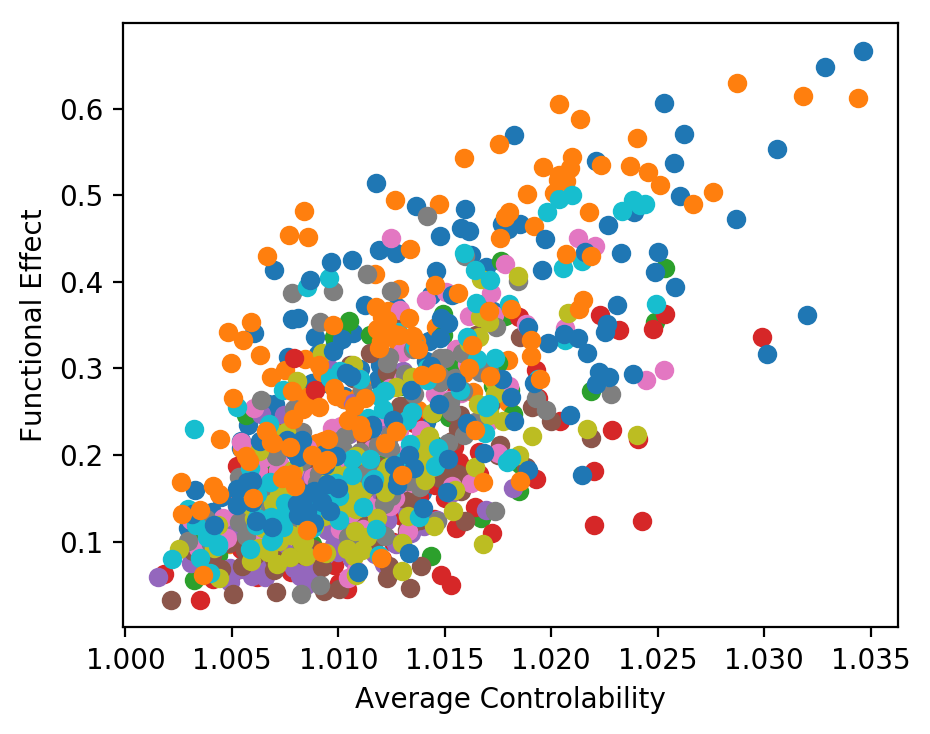

In [176]:
res = np.load('res_I05_seed42_sig0001_tstart20000.npy')
plt.figure(figsize=(5,4), dpi=200)
for i, sc in enumerate(SCs):
    ave_control = calc_ave_control(sc) 
    plt.plot(ave_control, res[0][i,:], 'o',label=r'$I=0.5, seed=42, Subj={}$'.format(i+1))
    plt.xlabel('Average Controlability'); plt.ylabel('Functional Effect')
    #plt.legend()

 ######### _____ SUBJECT 1 _____ ######### 


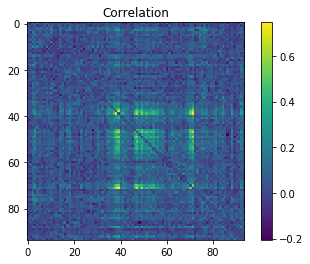

5.4817038809960605 34.817427261240816
 ######### _____ SUBJECT 2 _____ ######### 


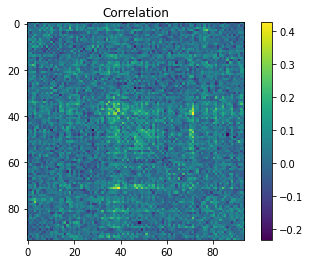

2.9358511726300156 34.416653793656025
 ######### _____ SUBJECT 3 _____ ######### 


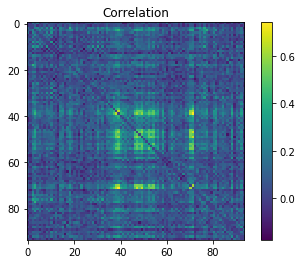

6.821537138997047 33.73159112351525
 ######### _____ SUBJECT 4 _____ ######### 


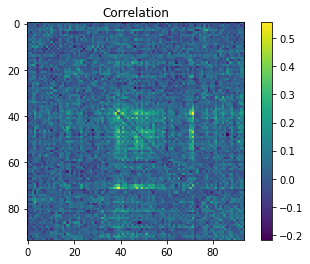

4.303281579392257 36.61123659971191
 ######### _____ SUBJECT 5 _____ ######### 


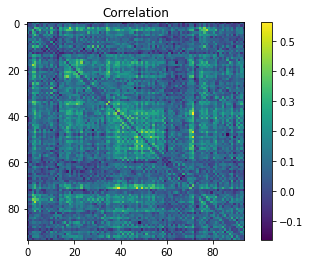

6.31710052936188 30.344773877025382
 ######### _____ SUBJECT 6 _____ ######### 


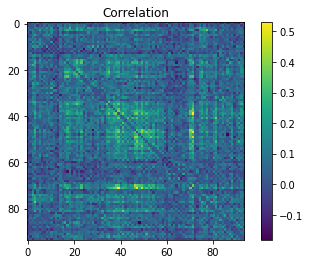

5.484677245135116 34.88442326531779
 ######### _____ SUBJECT 7 _____ ######### 


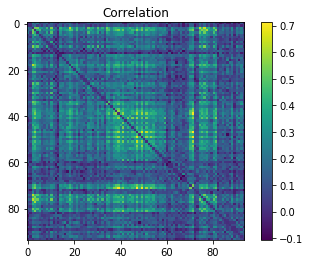

9.964418808294319 34.36365116156739
 ######### _____ SUBJECT 8 _____ ######### 


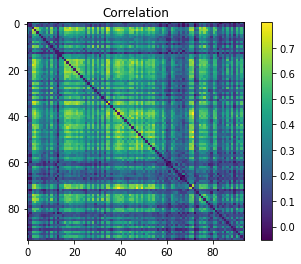

15.308034708031807 34.9360287540453
 ######### _____ SUBJECT 9 _____ ######### 


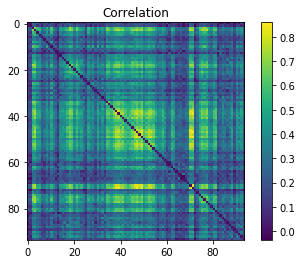

15.401750397165701 34.30879788347129
 ######### _____ SUBJECT 10 _____ ######### 


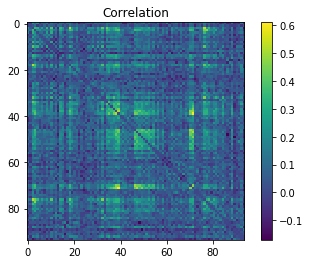

6.498557320030058 35.99864899065617
 ######### _____ SUBJECT 11 _____ ######### 


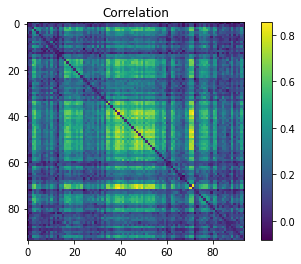

15.972064030656538 41.02576203771224
 ######### _____ SUBJECT 12 _____ ######### 


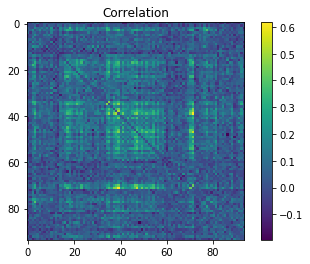

6.0160609346800324 39.38571594358864


In [184]:
par = load_parameters()
par['I'] = 0.5
par['sigma'] = 0.001
tstart=20000 # in unit of timesteps dt

functionalEffect_t1 = np.zeros((len(SCs), par['N']))
structuralEffect_t1 = np.zeros((len(SCs), par['N']))
fractionalActivation_t1 = np.zeros((len(SCs), par['N']))

#iterate through all SCs
for i, sc in enumerate(SCs):
    par['K'] = transitionK_I05[1][i]
    par['SC'] = sc
    print(' ######### _____ SUBJECT {} _____ ######### '.format(i+1))
    _, xs_base, _,_,_,_ = timeIntegrationRK4(par,randomseed=1)
    PC_base = plot_PC(xs_base, tstart)
    
    #iterate through all all nodes of one SC and calc func & struc effect
    for n in range(par['SC'].shape[0]):
        _,xs_stim,_,_,_,_ = timeIntegrationRK4(par, randomseed=1, stimNode=n)
        
        # fractActThres=0.6 as used in Muldoon paper.
        fe, fa = functional_effect(xs_base, xs_stim, n, tstart, fractActThres=0.6, plot=False)
        se = structural_effect(par['SC'], xs_stim, tstart, basecor=PC_base)
        functionalEffect_t1[i,n] = fe 
        structuralEffect_t1[i,n] = se 
        fractionalActivation_t1[i,n] = fa
        
np.save('res_I05_seed1_sig0001_tstart20000', [functionalEffect_t1, structuralEffect_t1, fractionalActivation_t1])

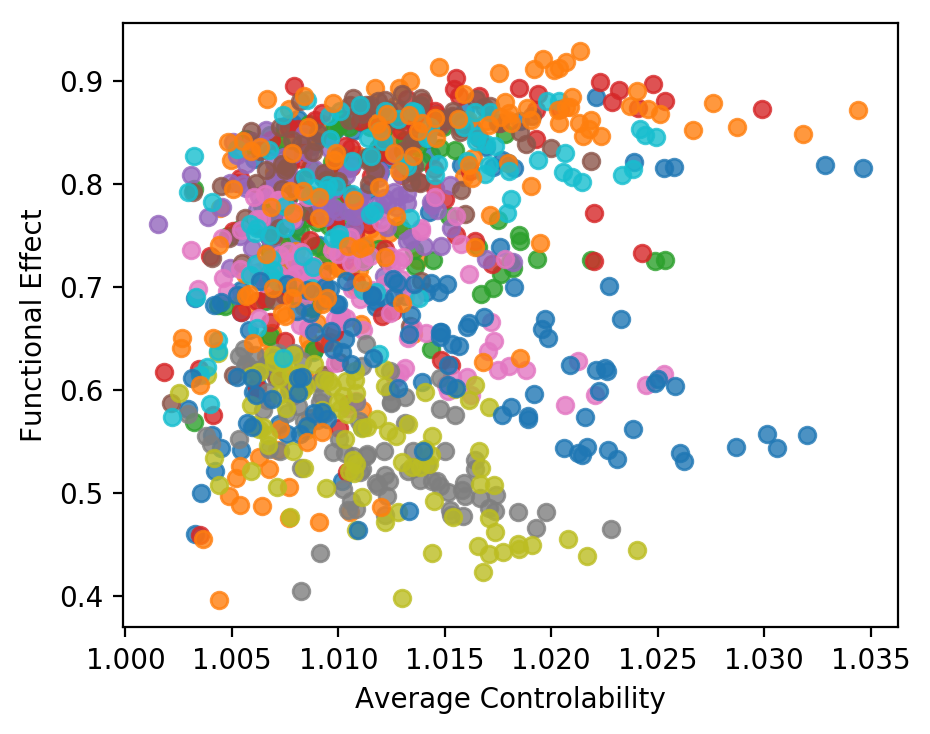

In [185]:
res1 = np.load('res_I05_seed1_sig0001_tstart20000.npy')
plt.figure(figsize=(5,4), dpi=200)
for i, sc in enumerate(SCs):
    ave_control = calc_ave_control(sc) 
    plt.plot(ave_control, res1[0][i,:], 'o',label=r'$I=0.5, seed=1, Subj={}$'.format(i+1), alpha=0.8)
    plt.xlabel('Average Controlability'); plt.ylabel('Functional Effect')
    #plt.legend()

 ######### _____ SUBJECT 1 _____ ######### 


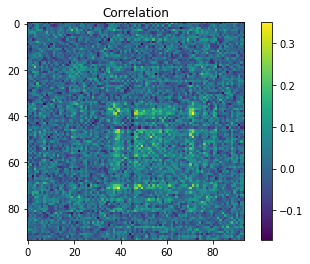

2.7413015064417015 34.817427261240816
 ######### _____ SUBJECT 2 _____ ######### 


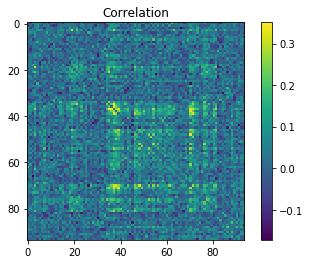

3.305523534487852 34.416653793656025
 ######### _____ SUBJECT 3 _____ ######### 


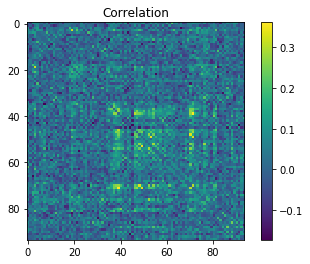

3.368203916442167 33.73159112351525
 ######### _____ SUBJECT 4 _____ ######### 


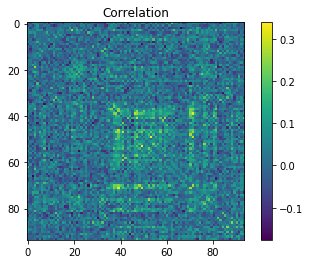

3.3159063696887534 36.61123659971191
 ######### _____ SUBJECT 5 _____ ######### 


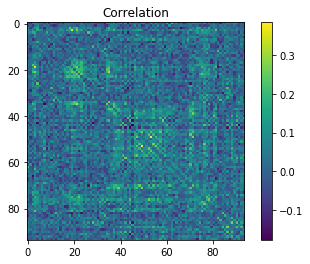

3.50217415595483 30.344773877025382
 ######### _____ SUBJECT 6 _____ ######### 


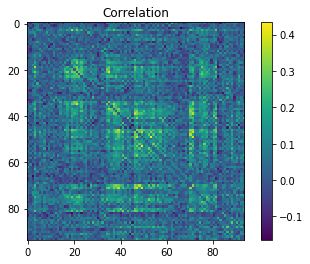

5.118970711433685 34.88442326531779
 ######### _____ SUBJECT 7 _____ ######### 


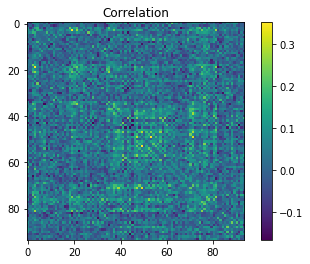

3.5419865420215326 34.36365116156739
 ######### _____ SUBJECT 8 _____ ######### 


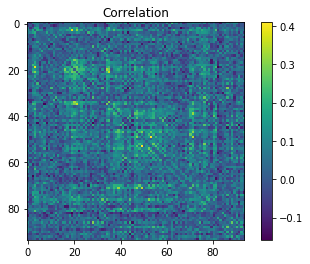

4.365313976739679 34.9360287540453
 ######### _____ SUBJECT 9 _____ ######### 


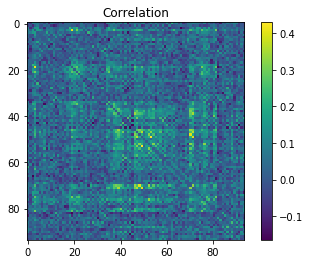

4.505305362769439 34.30879788347129
 ######### _____ SUBJECT 10 _____ ######### 


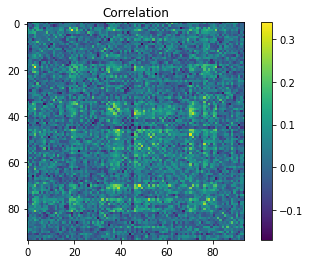

3.2220291365234006 35.99864899065617
 ######### _____ SUBJECT 11 _____ ######### 


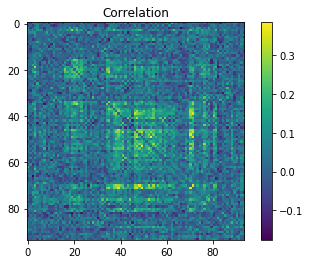

4.866440404448809 41.02576203771224
 ######### _____ SUBJECT 12 _____ ######### 


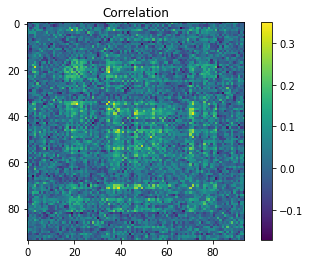

3.758311435099388 39.38571594358864


In [182]:
par = load_parameters()
par['I'] = 0.5
par['sigma'] = 0.001
tstart=20000 # in unit of timesteps dt

functionalEffect_t1 = np.zeros((len(SCs), par['N']))
structuralEffect_t1 = np.zeros((len(SCs), par['N']))
fractionalActivation_t1 = np.zeros((len(SCs), par['N']))

#iterate through all SCs
for i, sc in enumerate(SCs):
    par['K'] = transitionK_I05[2][i]
    par['SC'] = sc
    print(' ######### _____ SUBJECT {} _____ ######### '.format(i+1))
    _, xs_base, _,_,_,_ = timeIntegrationRK4(par,randomseed=2)
    PC_base = plot_PC(xs_base, tstart)
    
    #iterate through all all nodes of one SC and calc func & struc effect
    for n in range(par['SC'].shape[0]):
        _,xs_stim,_,_,_,_ = timeIntegrationRK4(par, randomseed=2, stimNode=n)
        
        # fractActThres=0.6 as used in Muldoon paper.
        fe, fa = functional_effect(xs_base, xs_stim, n, tstart, fractActThres=0.6, plot=False)
        se = structural_effect(par['SC'], xs_stim, tstart, basecor=PC_base)
        functionalEffect_t1[i,n] = fe 
        structuralEffect_t1[i,n] = se 
        fractionalActivation_t1[i,n] = fa
        
np.save('res_I05_seed2_sig0001_tstart20000', [functionalEffect_t1, structuralEffect_t1, fractionalActivation_t1])

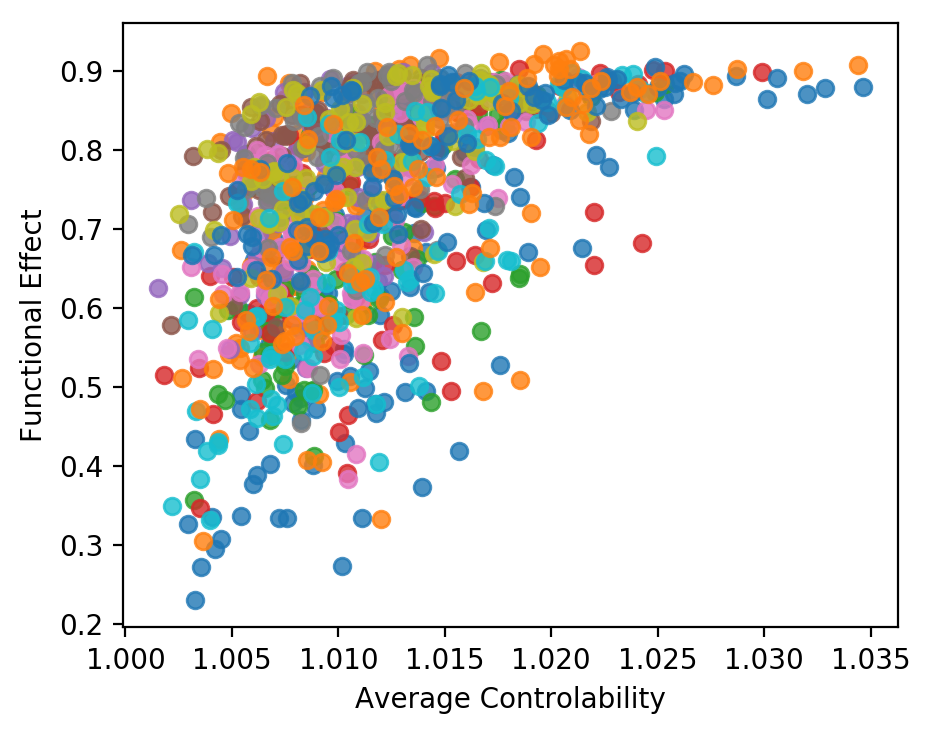

In [183]:
res2 = np.load('res_I05_seed2_sig0001_tstart20000.npy')
plt.figure(figsize=(5,4), dpi=200)
for i, sc in enumerate(SCs):
    ave_control = calc_ave_control(sc) 
    plt.plot(ave_control, res2[0][i,:], 'o',label=r'$I=0.5, seed=2, Subj={}$'.format(i+1), alpha=0.8)
    plt.xlabel('Average Controlability'); plt.ylabel('Functional Effect')
    #plt.legend()

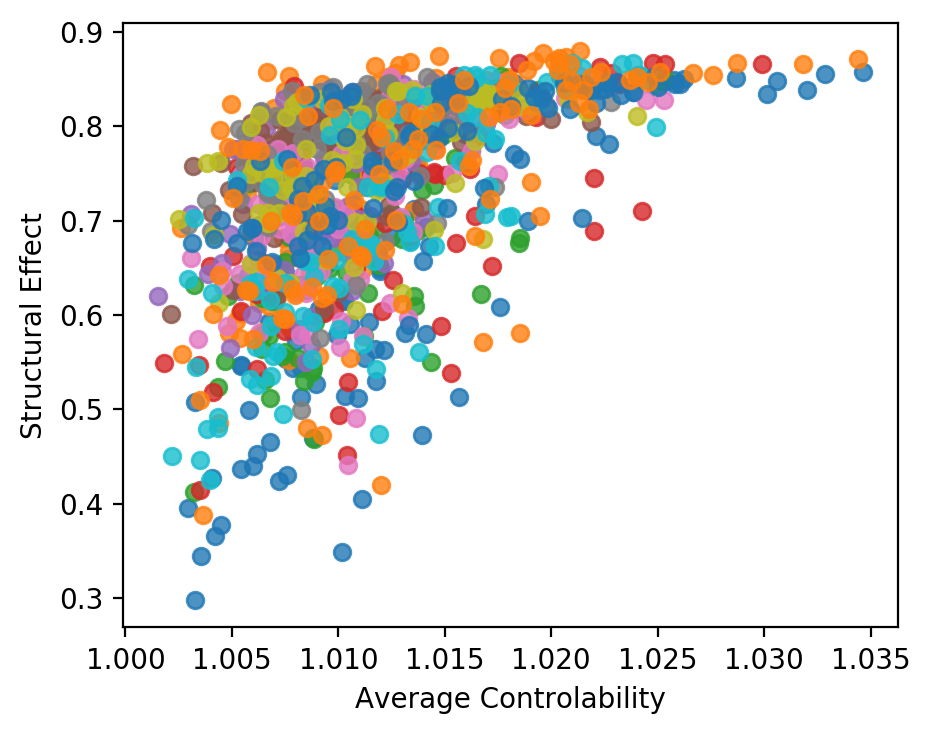

In [186]:
res2 = np.load('res_I05_seed2_sig0001_tstart20000.npy')
plt.figure(figsize=(5,4), dpi=200)
for i, sc in enumerate(SCs):
    ave_control = calc_ave_control(sc) 
    plt.plot(ave_control, res2[1][i,:], 'o',label=r'$I=0.5, seed=2, Subj={}$'.format(i+1), alpha=0.8)
    plt.xlabel('Average Controlability'); plt.ylabel('Structural Effect')
    #plt.legend()

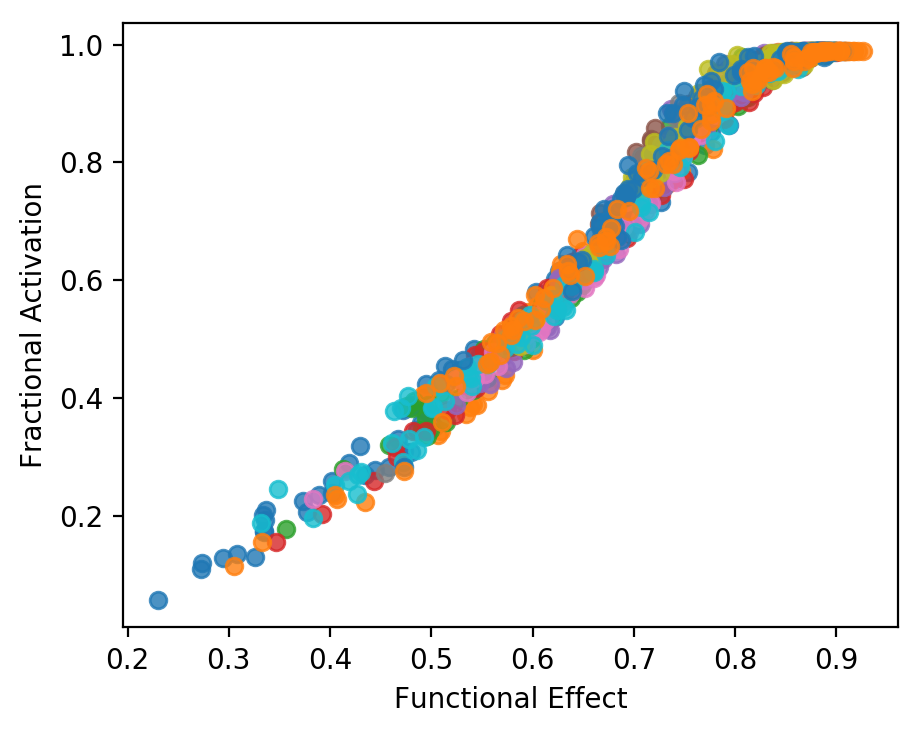

In [191]:
res2 = np.load('res_I05_seed2_sig0001_tstart20000.npy')
plt.figure(figsize=(5,4), dpi=200)
for i, sc in enumerate(SCs):
    ave_control = calc_ave_control(sc) 
    plt.plot(res2[0][i,:], res2[2][i,:], 'o',label=r'$I=0.5, seed=2, Subj={}$'.format(i+1), alpha=0.8)
    plt.xlabel('Functional Effect'); plt.ylabel('Fractional Activation')
    #plt.legend()

 ######### _____ SUBJECT 1 _____ ######### 


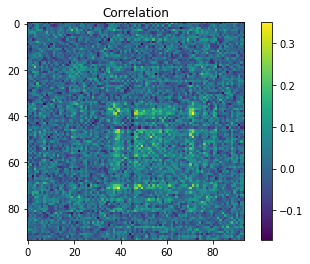


 ######### _____ SUBJECT 2 _____ ######### 


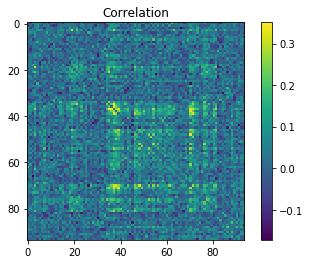


 ######### _____ SUBJECT 3 _____ ######### 


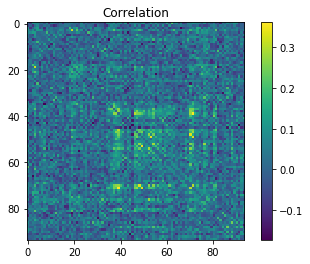


 ######### _____ SUBJECT 4 _____ ######### 


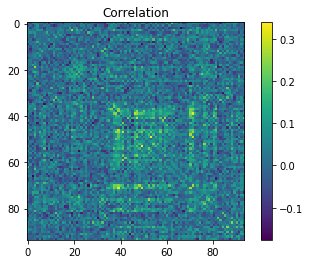


 ######### _____ SUBJECT 5 _____ ######### 


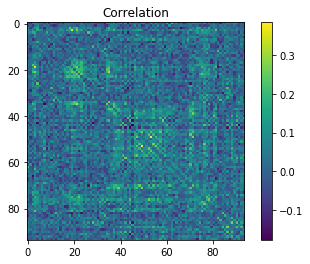


 ######### _____ SUBJECT 6 _____ ######### 


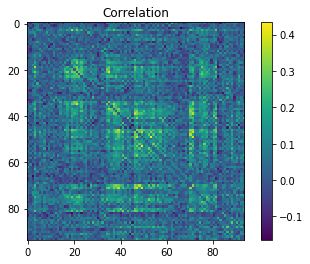


 ######### _____ SUBJECT 7 _____ ######### 


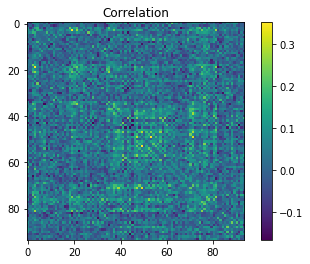


 ######### _____ SUBJECT 8 _____ ######### 


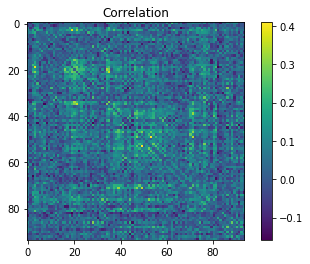


 ######### _____ SUBJECT 9 _____ ######### 


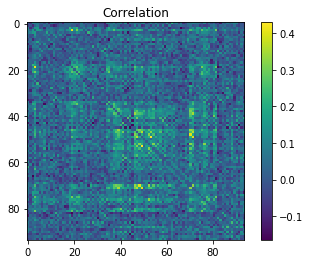


 ######### _____ SUBJECT 10 _____ ######### 


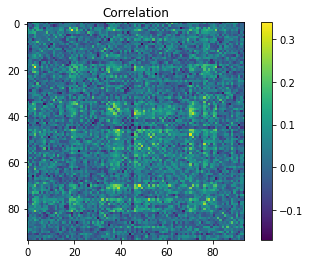


 ######### _____ SUBJECT 11 _____ ######### 


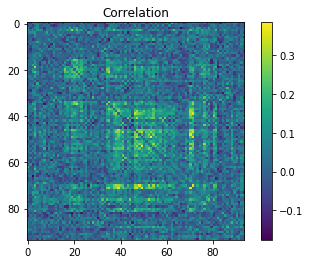


 ######### _____ SUBJECT 12 _____ ######### 


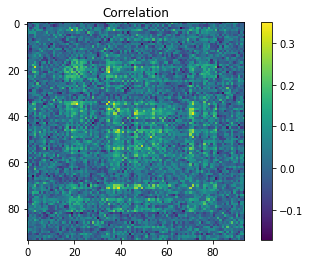

In [258]:
par = load_parameters()
par['I'] = 0.5
par['sigma'] = 0.001
tstart=20000 # in unit of timesteps dt

structuralEffect_t1 = np.zeros((len(SCs), par['N']))

#iterate through all SCs
for i, sc in enumerate(SCs):
    par['K'] = transitionK_I05[2][i]
    par['SC'] = sc
    print(' ######### _____ SUBJECT {} _____ ######### '.format(i+1))
    _, xs_base, _,_,_,_ = timeIntegrationRK4(par,randomseed=2)
    PC_base = plot_PC(xs_base, tstart)
    
    #iterate through all all nodes of one SC and calc func & struc effect
    for n in tqdm_notebook(range(par['SC'].shape[0])):
        _,xs_stim,_,_,_,_ = timeIntegrationRK4(par, randomseed=2, stimNode=n)
        
        se = structural_effect(par['SC'], xs_stim, tstart, basecor=PC_base)
        structuralEffect_t1[i,n] = se 
        


In [254]:
a = None

In [259]:
a.any() == None

AttributeError: 'NoneType' object has no attribute 'any'

In [ ]:
[functionalEffect_t1, _, fractionalActivation_t1] = np.load('res_I05_seed2_sig0001_tstart20000_')
np.save('res_I05_seed2_sig0001_tstart20000', [functionalEffect_t1, structuralEffect_t1, fractionalActivation_t1])